# IMPORTAR PAQUETES


In [1]:
import numpy as np
import matplotlib.pyplot as plt
import statistics
import pandas as pd 
from scipy.optimize import curve_fit
from sklearn.metrics import f1_score
from sklearn.metrics import mean_squared_error
from sklearn.metrics import mean_absolute_error
from sklearn.metrics import r2_score
from sklearn.ensemble import RandomForestRegressor  
from sklearn.linear_model import LinearRegression
from sklearn.model_selection import train_test_split                                                                 
from sklearn import metrics 
import matplotlib.cm as cm
import matplotlib as mpl
import math
import scipy.stats as stats
from mpl_toolkits import mplot3d
from matplotlib.collections import LineCollection
from matplotlib.colors import Normalize
from matplotlib.cm import ScalarMappable
from matplotlib.axes._axes import _log as matplotlib_axes_logger
import statsmodels.api as sm
from tqdm.notebook import tqdm
matplotlib_axes_logger.setLevel('ERROR')
plt.rcParams["font.family"] = "Times New Roman"



# PARÁMETROS PARA LLENAR


In [2]:
################# SETIAR SIEMPRE

bot=-220     ## desde donde 
top=-50 #en detuning ## hasta donde
comp='Bz' #PARA LABELS
titulo='Bz' #PARA TITULOS Y GUARDAS
Fa=4 # F inicia siempre 4
Fb=5 #F final
mF=5.0 #mF a mirar
W0_teo=351.7219605336 #EN MHz freq. de resonancia teorica para la transición


# PARÁMETROS QUE NO CAMBIAN


In [3]:
m=2.20694657*10**(-25)  
t=np.linspace(0.01,20,10000)
tn=np.linspace(0.01,10*1000,10000*1000)
T=291.15
l=0.001*2
tau=30.405e-9    
lf=1e-6/tau    
me=9.10938215e-31  ##electron mass en kg
h_c=6.62607015e-34     ## CNTE planck en J/s
mu_B=1.399624604*h_c  ##magneton de Bohr en  MHz/G
mu_B_sin=1.399624604

dif_detuning54=251.0916  #en megzs 
dif_detuning53=452.3787  #en megzs
dif_detuning55=0
dif_detuning34=(dif_detuning53+dif_detuning54)/2


dNu54=251.0916  #en megzs
dNu53=452.3787  #en megzs
desfase=150 #desfase del wavele


J3_symbol=0.30151134457776363 ## de F4 a F5, mF4 a mF5
J6_symbol=0.16666666666666666  ##de F4 a F5, mF4 a mF5

Vy_0_o=3.2670433333333337  ##VOltaje cuando no hay absorción.
L_celda=0.0718    ##en metros


# FUNCIONES VARIAS PARA SIMULACIONES DE MODELOS TEÓRICOS


In [4]:
def G(t,l,m,T,tn): 
    k=1.3806504*10**(-23)  
    t=t*10**-6
    tn=tn*10**-6
    c1=(m*l**2)/(k*T)
    G=c1*(1/t**3)*np.exp(-(c1/2)*(1/t**2))
    Gn=c1*(1/tn**3)*np.exp(-(c1/2)*(1/tn**2))
    norm=sum(Gn)
    G=G/norm
    return G
def CO_anisotro(A1,A2):
    A_CO=(A1+A2)/2
    return(A_CO)
def Disper(A,detuning,dif_detuning):
    x=10/(lf*np.pi) #factor x en disp
    F=x*(detuning+dif_detuning)
    Disper=A*F/(1+F**2)
    return(Disper)
def Sum_anisotro( detuning, A3, A4, A5):
    A34=CO_anisotro(A3,A4)
    A35=CO_anisotro(A3,A5)
    A45=CO_anisotro(A4,A5)
    Signal_3=Disper(A3,detuning, dif_detuning53)
    Signal_34=Disper(A34,detuning, dif_detuning34)
    Signal_35=Disper(A35,detuning, dif_detuning53/2)
    Signal_4=Disper(A4,detuning, dif_detuning54)
    Signal_45=Disper(A45,detuning, dif_detuning54/2)
    Signal_5=Disper(A5,detuning, dif_detuning55)
    Signal=Signal_3+ Signal_34+Signal_35+Signal_4+ Signal_45+Signal_5
    return(Signal)

# TIEMPO DE VUELO

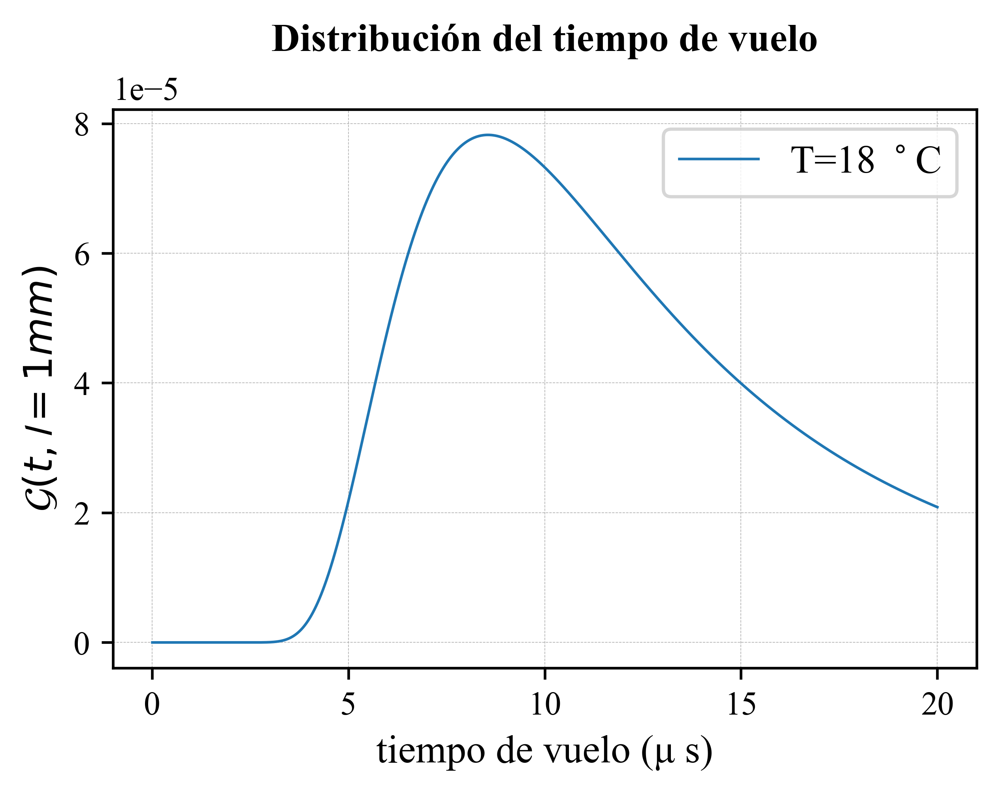

In [5]:
fig0=plt.figure(figsize=(4.70,3.12), dpi=600)
plt.plot(t,G(t,l,m,T,tn),label=r'T=18 $^\circ$C',lw=0.8)
plt.xlabel("tiempo de vuelo (\u03BC s)", fontsize=12)
plt.ylabel(r'$\mathcal{G}(t, \mathcal{l}=1mm)$', fontsize=12)
plt.legend( fontsize=12)
plt.title('Distribución del tiempo de vuelo', fontsize=12, y=1.07,fontweight="bold")
plt.grid(linestyle = '--', linewidth = 0.2)
plt.savefig('DTV.png', bbox_inches='tight')
plt.show()



In [6]:
sum(G(t,l,m,T,tn))

0.3801340193153539

In [7]:
lis=G(t,l,m,T,tn)
maximo=max(lis)
print(maximo)
lis=lis.tolist()
indice=lis.index(maximo)
print(indice)
print('--')
print(t[indice])

7.823743256802863e-05
4275
--
8.556579657965795


In [8]:
tiempop=sum(lis)/len(t)
print(tiempop)

3.801340193153539e-05


## SIMULACIÓN MODELO TEÓRICO (HARRIS)


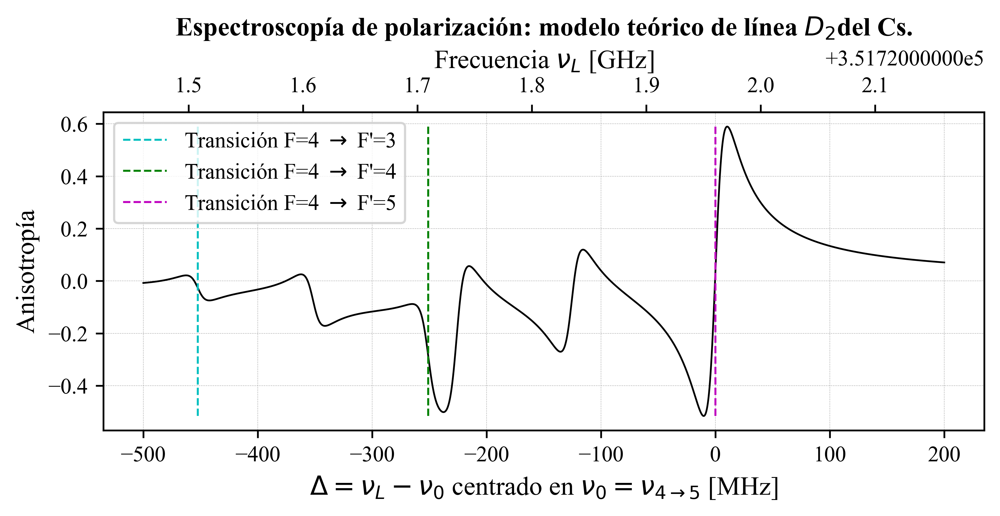

In [9]:
fig1, ax=plt.subplots(constrained_layout=True, figsize=(6.29,3.14), dpi=600)
detuning=np.linspace(-500,200,8001)
disp=Sum_anisotro(detuning,-7/72,-7/24,20/18)
ax.plot(detuning,disp, c='k', lw=0.8)
ax.plot([-dif_detuning53,-dif_detuning53],[np.min(disp),np.max(disp)],'--',c='c',label=r"Transición F=4 $\rightarrow$ F'=3",linewidth = 0.9)
ax.plot([-dif_detuning54,-dif_detuning54],[np.min(disp),np.max(disp)],'--',c='g', label=r"Transición F=4 $\rightarrow$ F'=4",linewidth = 0.9)
ax.plot([0,0],[np.min(disp),np.max(disp)],'--',c='m', label=r"Transición F=4 $\rightarrow$ F'=5",linewidth = 0.9)
ax.set_xlabel(r'$\Delta=\nu_L-\nu_0$'+' centrado en '+r'$\nu_0=\nu_{4\rightarrow 5}$'+' [MHz]', fontsize=12)
ax.set_ylabel('Anisotropía', fontsize=12)
ax.set_title('Espectroscopía de polarización: modelo teórico de línea '+r'$D_2$'+'del Cs.', fontsize=12, y=1.2,fontweight="bold")
def det_frec(x):
    return (x + 351.7219605336*10**6)/1000
def frec_det(x):
    return (x - 351.7219605336*10**6)/1000
secax = ax.secondary_xaxis('top', functions=(det_frec, frec_det))
secax.set_xlabel(r'Frecuencia $\nu_L$ [GHz]', fontsize=12)
plt.legend( fontsize=10, loc="upper left")
plt.grid(linestyle = '--', linewidth = 0.2)
plt.savefig('SIMULACION.png',bbox_inches='tight')
plt.show()

# SE CARGAN DATOS EXPERIMENTALES

### SE ORGANIZAN DE MENOR A MAYOR 

In [10]:
from glob import glob

data_n = glob('*.xlsx')
data_s= sorted(data_n)

B=[]
for i in data_s:
    name_o = i.split('.')[0].replace(",",".")
    name_o=float(name_o)
    B.append(name_o)

data = [i for _,i in sorted(zip(B,data_s))]


In [11]:
print(data)

['-9,844.xlsx', '-7,878.xlsx', '-4,927.xlsx', '-3,941.xlsx', '-2,956.xlsx', '-1,969.xlsx', '-0,984.xlsx', '-0,787.xlsx', '-0,492.xlsx', '-0,393.xlsx', '-0,296.xlsx', '-0,196.xlsx', '-0,099.xlsx', '-0,079.xlsx', '-0,049.xlsx', '-0,039.xlsx', '-0,029.xlsx', '-0,019.xlsx', '-0,009.xlsx', '0,001.xlsx', '0,029.xlsx', '0,039.xlsx', '0,049.xlsx', '0,059.xlsx', '0,069.xlsx', '0,099.xlsx', '0,119.xlsx', '0,217.xlsx', '0,315.xlsx', '0,414.xlsx', '0,513.xlsx', '0,809.xlsx', '1,007.xlsx', '1,996.xlsx', '2,987.xlsx', '3,975.xlsx', '4,963.xlsx', '7,925.xlsx', '9,9.xlsx']


# DATOS EXPERIMENTALES 2D

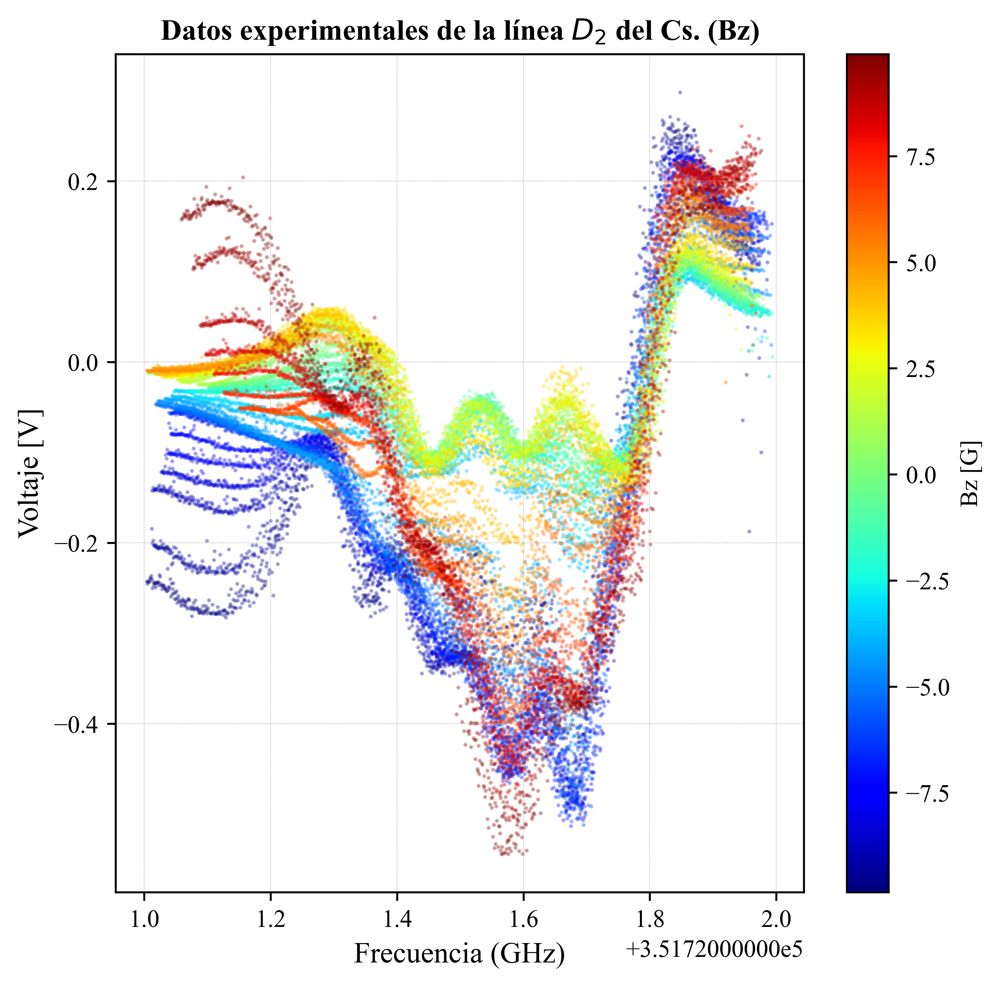

In [12]:
colors_1 = cm.jet(np.linspace(0, 1, len(data)))
step_1=0
fig2 = plt.figure(figsize=(6.29,6.29), dpi=600)
for i in data:
    xls = pd.read_excel(i)
    name = i.split('.')[0].replace(",",".")
    name=float(name)
    xls['Frecuancia (THz)  - Plot 0']= xls['Frecuancia (THz)  - Plot 0'].str.replace(",",".").astype('float')
    xls['Voltaje en Fotodiodo (V) - Plot 0']= xls['Voltaje en Fotodiodo (V) - Plot 0'].str.replace(",",".").astype('float')
    t = xls['Frecuancia (THz)  - Plot 0']
    e = xls['Voltaje en Fotodiodo (V) - Plot 0']
    list_values = xls.values.tolist()
    prom = pd.DataFrame(list_values).groupby(0,as_index = False)[1].mean().values.tolist()
    df = pd.DataFrame(prom)
    y = df[1]
    x= df[0]
    plt.scatter(x*1000,y,s=0.5, alpha=0.3, label=str(name)+' G = ' +str(comp), c=colors_1[step_1],edgecolors=None)
    step_1+=1

norm=Normalize(min(B), max(B))
cmap = plt.get_cmap('jet')
plt.title('Datos experimentales de la línea '+r'$D_2$'+' del Cs. ('+str(titulo)+')', fontsize=12,fontweight="bold")
plt.xlabel('Frecuencia (GHz)',fontsize=12)
plt.ylabel('Voltaje [V]',fontsize=12)
plt.grid(linestyle = '--', linewidth = 0.2)
#plt.legend(  fontsize=8,ncol=2,labelspacing=0.05,markerscale=10, scatterpoints=1) 
plt.colorbar(ScalarMappable(norm=norm, cmap=cmap),label="Bz [G]")
plt.savefig(str(titulo)+'_raw.png',bbox_inches='tight')
plt.show()
    
    


### SE SUMAN TODAS LAS SEÑALES Y SE VE EL MAX Y MIN GLOBAL (TODOS LOS B)

In [13]:
lista_todas_V=[]

for i in data:
    xls = pd.read_excel(i)
    name = i.split('.')[0].replace(",",".")
    name=float(name)
    xls['Frecuancia (THz)  - Plot 0']= xls['Frecuancia (THz)  - Plot 0'].str.replace(",",".").astype('float')
    xls['Voltaje en Fotodiodo (V) - Plot 0']= xls['Voltaje en Fotodiodo (V) - Plot 0'].str.replace(",",".").astype('float')
    t = xls['Frecuancia (THz)  - Plot 0']
    e = xls['Voltaje en Fotodiodo (V) - Plot 0']
    list_values = xls.values.tolist()
    prom = pd.DataFrame(list_values).groupby(0,as_index = False)[1].mean().values.tolist()
    df = pd.DataFrame(prom)
    y = df[1]
    lista_todas_V.extend(y)
    
min_norm=min(lista_todas_V)
max_norm=max(lista_todas_V)

# DATOS EXPERIMENTALES 3D

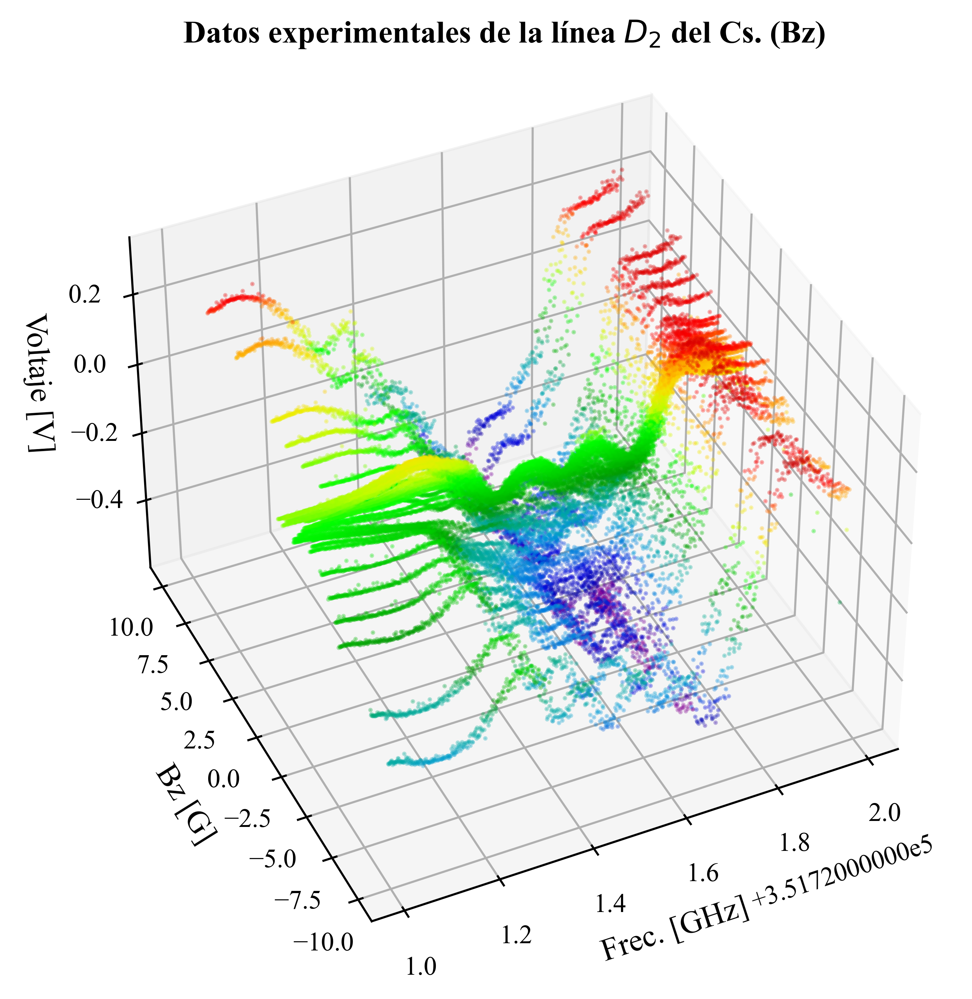

In [14]:
fig3 = plt.figure(figsize=(6.29,6.29), dpi=600)
ax = plt.axes(projection='3d')
for i in data:
    xls = pd.read_excel(i)
    name = i.split('.')[0].replace(",",".")
    name=float(name)
    xls['Frecuancia (THz)  - Plot 0']= xls['Frecuancia (THz)  - Plot 0'].str.replace(",",".").astype('float')
    xls['Voltaje en Fotodiodo (V) - Plot 0']= xls['Voltaje en Fotodiodo (V) - Plot 0'].str.replace(",",".").astype('float')
    t = xls['Frecuancia (THz)  - Plot 0']
    e = xls['Voltaje en Fotodiodo (V) - Plot 0']
    list_values = xls.values.tolist()
    prom = pd.DataFrame(list_values).groupby(0,as_index = False)[1].mean().values.tolist()
    df = pd.DataFrame(prom)
    y = df[1]
    x= df[0]
    ax.scatter3D(x*1000,name,y,s=0.5, alpha=0.3, label=str(name)+' G = ' +str(comp), cmap='nipy_spectral',vmin=min_norm, vmax=max_norm, c=y,edgecolors=None)   


plt.title('Datos experimentales de la línea '+r'$D_2$'+' del Cs. ('+str(titulo)+')', fontsize=12,fontweight="bold")
plt.xlabel('Frec. [GHz]',fontsize=12)
ax.set_zlabel('Voltaje [V]',fontsize=12)
plt.ylabel(str(comp)+' [G]',fontsize=12)
plt.grid(linestyle = '--', linewidth = 0.2)
#plt.legend(  fontsize=8,ncol=2,labelspacing=0.05,markerscale=10, scatterpoints=1) 
#plt.colorbar(ScalarMappable(norm=norm, cmap=cmap),label="Bz [G]")
ax.view_init(40, -115)
plt.savefig(str(titulo)+'_raw_3d.png',bbox_inches='tight')
plt.show()

# FUNCIÓN PARA AJUSTAR DATOS (MODELO HARRIS)

### C1 X EN DISP ; dA3,4,5 CAMBIO EN ANISOTROPIAS; C00 DESFASE EXTRA DEL WL; N00 NORMALIZACIÓN

In [15]:
# objective functionc
def objective( Nun, C1,dA3,dA4,dA5,C00,N00): #C1 Dispersion C2 aMplitud norma C3 corrimiento en x C4 ccarri en Y
    
    A3=-7/72+dA3
    A4=-7/24+dA4
    A5=20/18+dA5
    c=C1/(lf*np.pi)
    
    Nu=Nun+desfase+C00
    
    A34=(A3+A4)/2
    A35=(A3+A5)/2
    A45=(A4+A5)/2
    
    #fa5=c*Nu+C55
    fa5=c*(Nu)
    v5=A5*fa5/(1+fa5*fa5)
    
    fa4=c*(Nu+dNu54)
    #fa4=c*(Nu+C44)
    v4=A4*fa4/(1+fa4*fa4)
    
    fa3=c*(Nu+dNu53)
    #fa3=c*(Nu+C33)
    v3=A3*fa3/(1+fa3*fa3)
    
    fa45=c*(Nu+dNu54/2)
    v45=A45*fa45/(1+fa45*fa45)
    
    fa35=c*(Nu+dNu54/2)
    v35=A35*fa35/(1+fa35*fa35)
    
    fa34=c*(Nu+(dNu53+dNu54)/2)
    v34=A34*fa34/(1+fa34*fa34)
    
    return N00*(v5+v4+v3+v45+v35+v34)

# AJUSTE DE TODOS LOS DATOS Y GRÁFICA

-9,844.xlsx 0
-7,878.xlsx 0
-4,927.xlsx 0
-3,941.xlsx 0
-2,956.xlsx 0
-1,969.xlsx 0
-0,984.xlsx 0
-0,787.xlsx 0
-0,492.xlsx 0
-0,393.xlsx 0
-0,296.xlsx 0
-0,196.xlsx 0
-0,099.xlsx 0
-0,079.xlsx 0
-0,049.xlsx 0
-0,039.xlsx 0
-0,029.xlsx 0
-0,019.xlsx 0
-0,009.xlsx 0
0,001.xlsx 0
0,029.xlsx 0
0,039.xlsx 0
0,049.xlsx 0
0,059.xlsx 0
0,069.xlsx 0
0,099.xlsx 0
0,119.xlsx 0
0,217.xlsx 0
0,315.xlsx 0
0,414.xlsx 0
0,513.xlsx 0
0,809.xlsx 0
1,007.xlsx 0
1,996.xlsx 0
2,987.xlsx 0
3,975.xlsx 0
4,963.xlsx 0
7,925.xlsx 0
9,9.xlsx 0


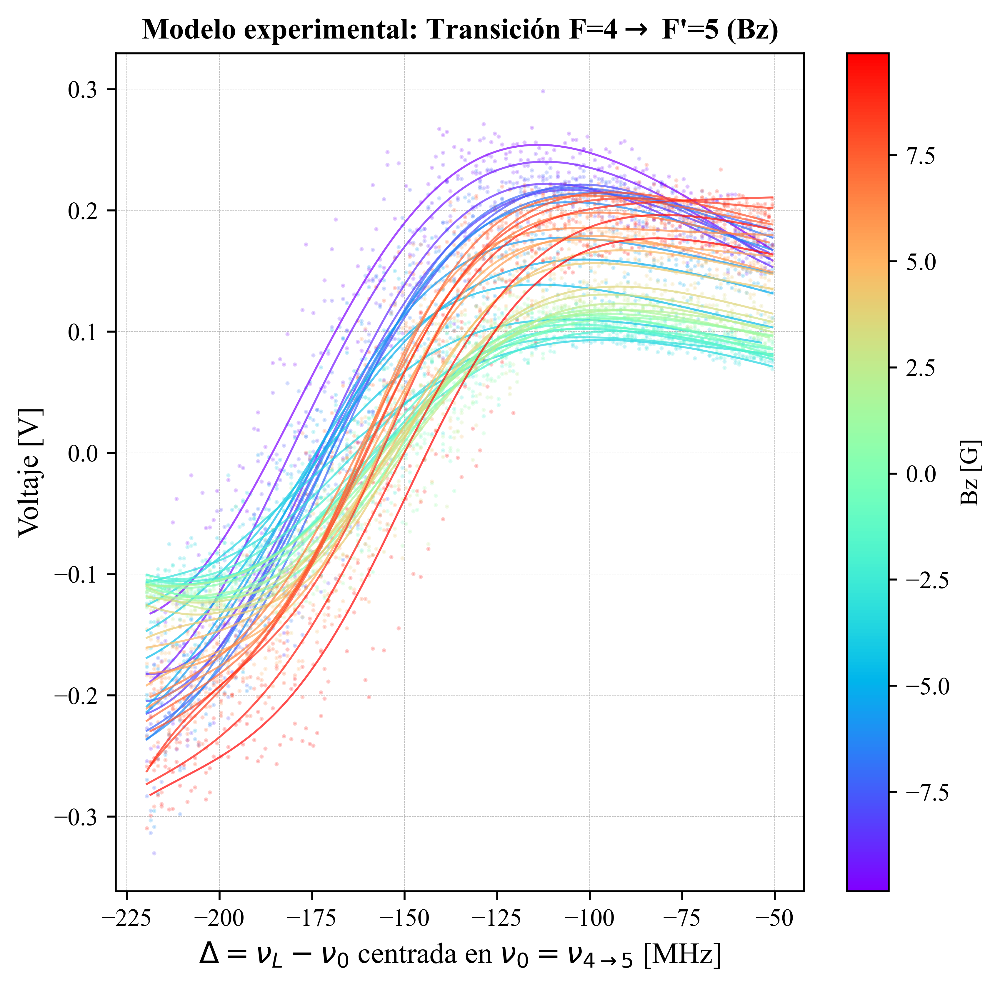

In [16]:
PARAS_TODOS=[]
R2=[]
ORDER=[]
SIGMAS=[]
PROMEDIOS_PLANOS=[]

def plano(dato,modelo):
    datos=np.array(dato)
    modelos=np.array(modelo)
    fun=datos-modelos
    return(fun)

colors_2 = cm.rainbow(np.linspace(0, 1, len(data)))
step_2=0

fig4 = plt.figure(figsize=(6.29,6.29), dpi=600)
for i in data:
    xls = pd.read_excel(i)
    name = i.split('.')[0].replace(",",".")
    name=float(name)
    xls['Frecuancia (THz)  - Plot 0']= xls['Frecuancia (THz)  - Plot 0'].str.replace(",",".").astype('float')
    xls['Voltaje en Fotodiodo (V) - Plot 0']= xls['Voltaje en Fotodiodo (V) - Plot 0'].str.replace(",",".").astype('float')
    t = xls['Frecuancia (THz)  - Plot 0']
    e = xls['Voltaje en Fotodiodo (V) - Plot 0']
    list_values = xls.values.tolist()
    prom = pd.DataFrame(list_values).groupby(0,as_index = False)[1].mean().values.tolist()
    df = pd.DataFrame(prom)
    y = df[1]
    x= df[0]
    # load input variables from a file
    
    x_val = x*10**6 - 351.7219606142006*10**6 #conversion a MHz
    y_val = y
    
    bot_in=0
    top_in=-1
    
    for n in range(len(x_val)): #top debe ser mayor que bot
        if (x_val[n]>bot and x_val[n]<top ):
            bot_in=n
            break
        else:
            continue
            
    for k in range(len(x_val)-2): #top debe ser mayor que bot
        kn=-(k+1)
        if k==0:
            if (float(x_val[kn:])<top and float(x_val[kn:])>bot ):
                top_in=kn
                break
            else:
                continue
        else:
            if (float(x_val[kn-1:kn])<top and float(x_val[kn-1:kn])>bot ):
                top_in=kn
                break
            else:
                continue
    
    x_values=x_val[bot_in:top_in]
    y_values=y_val[bot_in:top_in]
    
    #se gusrdan paras finales
    C1=[]
    dA3=[]
    dA4=[]
    dA5=[]
    C00=[]
    N00=[]
    #se guardan paras iniciales
    C1_0=[]
    dA3_0=[]
    dA4_0=[]
    dA5_0=[]
    C00_0=[]
    N00_0=[]
    #paras de medicion 
    mse=[]
    mae=[]
    
    
    for j in range(10):
        try:
            C1_i=np.random.uniform(3, 8)
            C1_0.append(C1_i)

            dA3_i=np.random.uniform(-0.3, 0.3)
            dA3_0.append(dA3_i)

            dA4_i=np.random.uniform(-0.3, 0.3)
            dA4_0.append(dA4_i)

            dA5_i=np.random.uniform(-0.3, 0.3)
            dA5_0.append(dA5_i)

            C00_i=np.random.uniform(-10, 10)
            C00_0.append(C00_i)

            N00_i=np.random.uniform(0.5, 1.5)
            N00_0.append(N00_i)


            #maxfev=10000
            popt, matrix = curve_fit(objective, x_values, y_values, p0=[ C1_i,dA3_i,dA4_i,dA5_i,C00_i,N00_i])


            C1.append(popt[0])
            dA3.append(popt[1])
            dA4.append(popt[2])
            dA5.append(popt[3])
            C00.append(popt[4])
            N00.append(popt[5])


            y_model=objective(x_values , popt[0],popt[1],popt[2],popt[3],popt[4],popt[5])

            mse_i=mean_squared_error(y_values, y_model,squared=False)
            mse.append(mse_i)

            mae_i=mean_absolute_error(y_values, y_model)
            mae.append(mae_i)
            

            #R2_i=sklearn.metrics.r2_score(y_values, y_model)
            #R2.append(R2_i)

        except:
            continue
        if (j%50==0):
            print(i,j)
            
    index_mse=np.argmin(mse)
    index_mae=np.argmin(mae)
    a=C1[index_mse],dA3[index_mse],dA4[index_mse],dA5[index_mse],C00[index_mse],N00[index_mse]
    PARAS_TODOS.append(a)
    nu=np.linspace(np.min(x_values),np.max(x_values),len(y_values))
    disp=objective(nu, C1[index_mse],dA3[index_mse],dA4[index_mse],dA5[index_mse],C00[index_mse],N00[index_mse])
    R2_i=r2_score(y_values, disp)
    R2.append(R2_i)
    ORDER.append(name)
    
    DATOS_PLANOS=plano(y_values, disp)
    sigma_i=np.std(DATOS_PLANOS, ddof=1)
    SIGMAS.append(sigma_i)
    PROMEDIOS_PLANOS.append(np.mean(DATOS_PLANOS))

            
    plt.plot(nu, disp, label=str(name)+' G = ' +str(comp)+r'; $R^2$= '+'{:.2f}'.format(R2_i),c=colors_2[step_2], lw=0.8,alpha=0.7)
    plt.scatter(x_values,y_values,s=0.5, alpha=0.2,c=colors_2[step_2])
    step_2+=1

norm=Normalize(min(B), max(B))
cmap = plt.get_cmap('rainbow')
plt.title('Modelo experimental:'+' Transición F='+str(Fa)+r"$\rightarrow$ F'="+str(Fb)+' ('+str(titulo)+')',fontsize=12,fontweight="bold")
plt.xlabel(r'$\Delta=\nu_L-\nu_0$'+' centrada en '+r'$\nu_0=\nu_{4\rightarrow 5}$'+' [MHz]', fontsize=12)
plt.ylabel('Voltaje [V]',fontsize=12)
plt.grid(linestyle = '--', linewidth = 0.2)
#plt.legend(loc="lower right") #fontsize='xx-large',
plt.colorbar(ScalarMappable(norm=norm, cmap=cmap),label="Bz [G]")
plt.savefig(str(titulo)+'_modelF4F'+str(Fb)+'.png',bbox_inches='tight')
plt.show()



In [17]:
# C1:  factor x en disp                             [0]   #
# dA3: cambio en A3                                 [1]   # 
# dA4: cambio en A4                                 [2]   # Esto hay en PARAS_TODOS
# dA5: cambio en A5                                 [3]   #
# C00: desfase de Wavele promedio                   [4]   #
# N00: normalizacion entre anisotropia y voltaje    [5]   #
            


# EXPLORACIÓN DE PARAMETROS DE AJUSTE ÚTILES

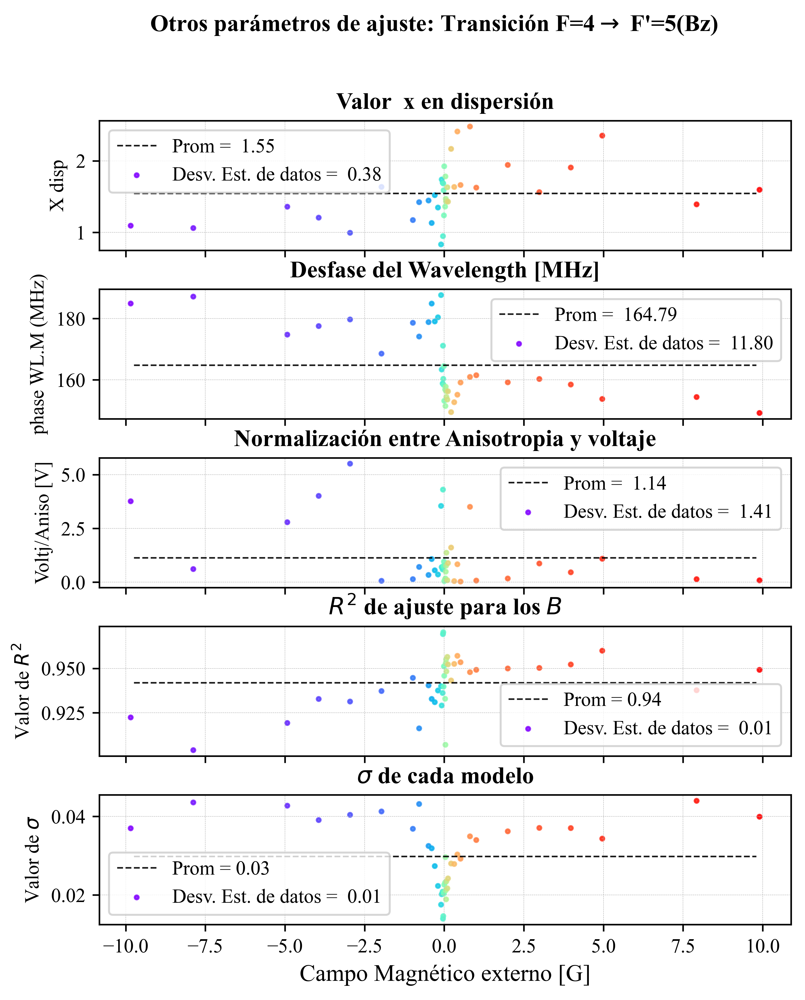

In [18]:
fig5, axs = plt.subplots(5, sharex=True, sharey=False, figsize=(6.29,7.5), dpi=600)
fig5.suptitle('Otros parámetros de ajuste: '+'Transición F='+str(Fa)+r"$\rightarrow$ F'="+str(Fb)+'('+str(titulo)+')', fontsize=12,fontweight="bold")


C1_3=[]
C00_3=[]
N00_3=[]
for i in range(len(PARAS_TODOS)):
    C1_3_i=PARAS_TODOS[i][0]
    C00_3_i=PARAS_TODOS[i][4]
    N00_3_i=PARAS_TODOS[i][5]
    C1_3.append(C1_3_i)
    C00_3.append(C00_3_i+desfase)
    N00_3.append(N00_3_i)
    

prom_C1=sum(C1_3)/len(C1_3)
de_C1=statistics.stdev(C1_3)
axs[0].scatter(ORDER, C1_3, label='Desv. Est. de datos =  {:.2f}'.format(de_C1),s=4, alpha=0.8, c=colors_2 )  # C1 disp
axs[0].axhline(y=prom_C1, xmin=0.05, xmax=0.95, c='k',linestyle="--", label=r'Prom =  {:.2f}'.format(prom_C1), lw=0.8,alpha=0.9 )
axs[0].legend(fontsize=10)
axs[0].set_ylabel('X disp', fontsize=10)
axs[0].grid(linestyle = '--', linewidth = 0.2)
axs[0].set_title("Valor  x en dispersión",fontsize=12,fontweight="bold")

prom_C00=sum(C00_3)/len(C00_3)
de_C00=statistics.stdev(C00_3)
axs[1].scatter(ORDER, C00_3, label='Desv. Est. de datos =  {:.2f}'.format(de_C00),s=4, alpha=0.8, c=colors_2) # C00 corr desfase WL+C00
axs[1].axhline(y=prom_C00, xmin=0.05, xmax=0.95, c='k',linestyle="--", label=r'Prom =  {:.2f}'.format(prom_C00), lw=0.8,alpha=0.9)
axs[1].legend(fontsize=10)
axs[1].set_ylabel('phase WL.M (MHz)', fontsize=10)
axs[1].grid(linestyle = '--', linewidth = 0.2)
axs[1].set_title("Desfase del Wavelength [MHz]",fontsize=12,fontweight="bold")

prom_N00=sum(N00_3)/len(N00_3)
de_N00=statistics.stdev(N00_3)
axs[2].scatter(ORDER, N00_3,label='Desv. Est. de datos =  {:.2f}'.format(de_N00),s=4, alpha=0.8, c=colors_2) # N00 normalizacion entre anisotropia y voltaje
axs[2].axhline(y=prom_N00, xmin=0.05, xmax=0.95, c='k',linestyle="--", label=r'Prom =  {:.2f}'.format(prom_N00), lw=0.8,alpha=0.9)
axs[2].legend(fontsize=10)
axs[2].set_ylabel('Voltj/Aniso [V]', fontsize=10)
axs[2].grid(linestyle = '--', linewidth = 0.2)
axs[2].set_title("Normalización entre Anisotropia y voltaje",fontsize=12,fontweight="bold")

prom_R2=sum(R2)/len(R2)
de_R2=statistics.stdev(R2)
axs[3].scatter(ORDER, R2, label='Desv. Est. de datos =  {:.2f}'.format(de_R2),s=4, alpha=0.8, c=colors_2)
axs[3].axhline(y=prom_R2, xmin=0.05, xmax=0.95, c='k',linestyle="--", label=r'Prom = {:.2f}'.format(prom_R2), lw=0.8,alpha=0.9)
axs[3].legend(fontsize=10)
axs[3].set_ylabel(r'Valor de $R^2$',fontsize=10)
axs[3].grid(linestyle = '--', linewidth = 0.2)
axs[3].set_title(r'$R^2$ de ajuste para los $B$', fontsize=12,fontweight="bold")

prom_SIGMAS=sum(SIGMAS)/len(SIGMAS)
de_SIGMAS=statistics.stdev(SIGMAS)
axs[4].scatter(ORDER, SIGMAS, label='Desv. Est. de datos =  {:.2f}'.format(de_SIGMAS),s=4, alpha=0.8, c=colors_2)
axs[4].axhline(y=prom_SIGMAS, xmin=0.05, xmax=0.95, c='k',linestyle="--", label=r'Prom = {:.2f}'.format(prom_SIGMAS), lw=0.8,alpha=0.9)
axs[4].legend(fontsize=10)
axs[4].set_xlabel(r'Campo Magnético externo [G]', fontsize=12)
axs[4].set_ylabel(r'Valor de $\sigma$',fontsize=10)
axs[4].grid(linestyle = '--', linewidth = 0.2)
axs[4].set_title(r'$\sigma$ de cada modelo', fontsize=12,fontweight="bold")


plt.subplots_adjust(hspace=0.3)
plt.savefig(str(titulo)+'_PARAMETERS_F4F'+str(Fb)+'.png',bbox_inches='tight')
plt.show()



In [19]:
print('Dispersion x:                          ',prom_C1)
print('desfase (desfase+C00 del modelo):      ',prom_C00)
print('relacion Voltaje/Anisotropia:          ',prom_N00)

Dispersion x:                           1.546481963672913
desfase (desfase+C00 del modelo):       164.78522781635974
relacion Voltaje/Anisotropia:           1.1377346067399154


### NORMALIZACIÓN PARA CMAP DE MODELO 3D

In [20]:
lista_todas_model=[]

for i in range(len(ORDER)):
    num=10000
    nu=np.linspace(bot,top,num)
    a=PARAS_TODOS[i]
    disp=objective(nu, a[0],a[1],a[2],a[3],a[4],a[5])
    lista_todas_model.extend(y)
    
min_norm_m=min(lista_todas_model)
max_norm_m=max(lista_todas_model)

# SEPARAR PARAS. INDIVIDUALES DE B Y BUSCAR CEROS 

In [21]:

y_max=[]
x_max=[]  ###tal vez pueda saber la dispersion del laser

y_min=[]

x_00=[]  #se mueve la tranci 4 5?

B_name_00=[]
B_sin_00=[]

C1_3=[]
C00_3=[]
N00_3=[]
A3_3=[]
A4_3=[]
A5_3=[]
for i in range(len(PARAS_TODOS)):
    C1_3_i=PARAS_TODOS[i][0]
    C00_3_i=PARAS_TODOS[i][4]
    N00_3_i=PARAS_TODOS[i][5]
    A3_3_i=PARAS_TODOS[i][1]
    A4_3_i=PARAS_TODOS[i][2]
    A5_3_i=PARAS_TODOS[i][3]

    C1_3.append(C1_3_i)
    C00_3.append(C00_3_i)
    N00_3.append(N00_3_i)
    A3_3.append(A3_3_i)
    A4_3.append(A4_3_i)
    A5_3.append(A5_3_i)

for i in range(len(ORDER)):
    
    num=10000
    nu=np.linspace(bot,top,num)
    a=PARAS_TODOS[i]
    disp=objective(nu, a[0],a[1],a[2],a[3],a[4],a[5])
    
    for j in range(len(nu)-1):
        r=disp[j]*disp[j+1]
        if r<0:
            b=abs(disp[j])*(abs(disp[j])+abs(disp[j+1]))/(abs(nu[j+1]-nu[j]))
            cero=nu[j]+abs(b)
            x_00.append(cero)
            B_name_00.append(ORDER[i])
            y_max.append(disp.max())
            y_min.append(disp.min())
            index_max=np.argmax(disp)
            x_max.append(nu[index_max])
            
        elif j==(len(nu)-1):
            
            B_sin_00.append(ORDER[i])
            
        else:
            continue
            


# PUNTOS ÚTILES DEL MODELO (ENTRE EL BOT Y EL TOP SELECCIONADO)

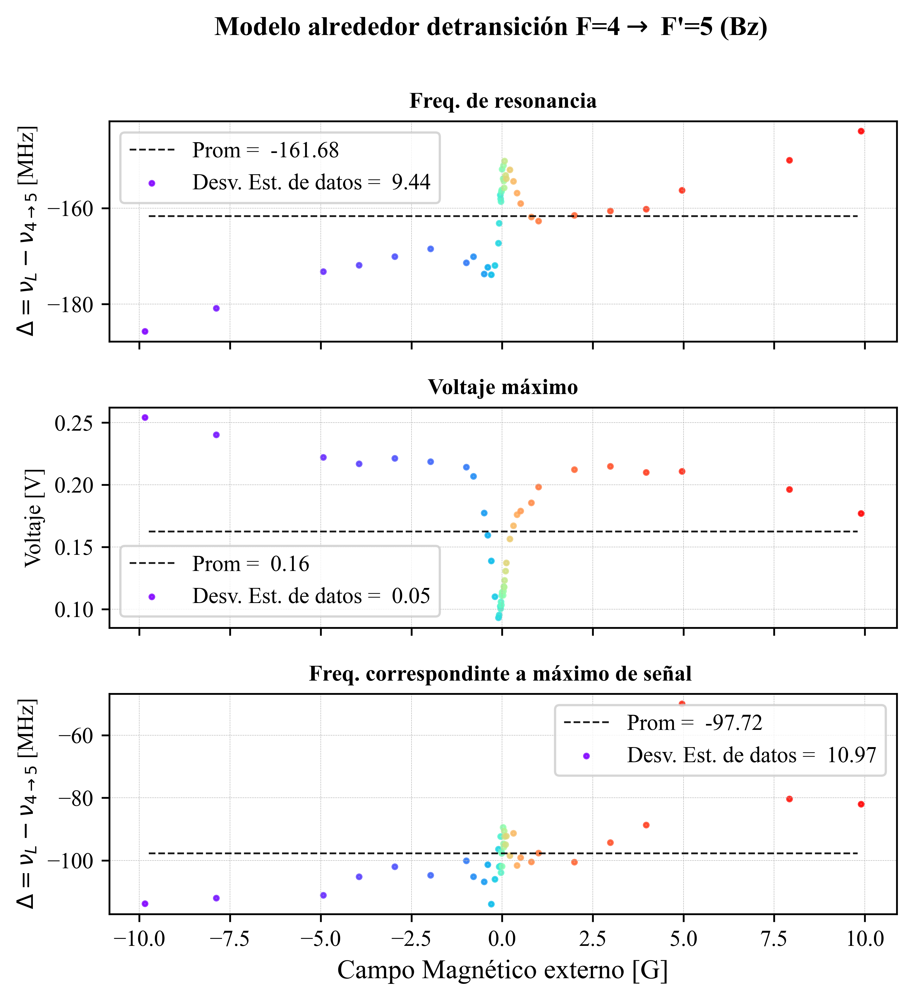

In [22]:
colors_3 = cm.rainbow(np.linspace(0, 1, len(B_name_00)))

fig6, axs = plt.subplots(3, sharex=True, sharey=False, figsize=(6.29,6.5), dpi=600)
fig6.suptitle('Modelo alrededor de'+'transición F='+str(Fa)+r"$\rightarrow$ F'="+str(Fb)+' ('+str(titulo)+')', fontsize=12,fontweight="bold")

prom_w=sum(x_00)/len(x_00)
de_w=statistics.stdev(x_00)
axs[0].scatter(B_name_00, x_00, label='Desv. Est. de datos =  {:.2f}'.format(de_w),s=4, alpha=0.8, c=colors_3)
axs[0].axhline(y=prom_w, xmin=0.05, xmax=0.95, c='k',linestyle="--", label=r'Prom =  {:.2f}'.format(prom_w), lw=0.8,alpha=0.9  )
axs[0].legend(fontsize=10)
axs[0].set_ylabel(r'$\Delta=\nu_L-\nu_{4\rightarrow '+str(Fb)+'}$'+' [MHz]',fontsize=10)
axs[0].grid(linestyle = '--', linewidth = 0.2)
axs[0].set_title('Freq. de resonancia',fontsize=10,fontweight="bold")

prom_y_max=sum(y_max)/len(y_max)
de_y_max=statistics.stdev(y_max)
axs[1].scatter(B_name_00, y_max, label='Desv. Est. de datos =  {:.2f}'.format(de_y_max),s=4, alpha=0.8, c=colors_3)
axs[1].axhline(y=prom_y_max, xmin=0.05, xmax=0.95, c='k',linestyle="--", label=r'Prom =  {:.2f}'.format(prom_y_max), lw=0.8,alpha=0.9  )
axs[1].legend(fontsize=10)
axs[1].set_ylabel('Voltaje'+' [V]',fontsize=10)
axs[1].grid(linestyle = '--', linewidth = 0.2)
axs[1].set_title('Voltaje máximo',fontsize=10,fontweight="bold")

prom_x_max=sum(x_max)/len(x_max)
de_x_max=statistics.stdev(x_max)
axs[2].scatter(B_name_00, x_max, label='Desv. Est. de datos =  {:.2f}'.format(de_x_max),s=4, alpha=0.8, c=colors_3)
axs[2].axhline(y=prom_x_max, xmin=0.05, xmax=0.95, c='k',linestyle="--", label=r'Prom =  {:.2f}'.format(prom_x_max), lw=0.8,alpha=0.9  )
axs[2].legend(fontsize=10)
axs[2].set_ylabel(r'$\Delta=\nu_L-\nu_{4\rightarrow '+str(Fb)+'}$'+' [MHz]',fontsize=10)
axs[2].set_xlabel(r'Campo Magnético externo [G]', fontsize=12)
axs[2].grid(linestyle = '--', linewidth = 0.2)
axs[2].set_title('Freq. correspondinte a máximo de señal ',fontsize=10,fontweight="bold")

plt.subplots_adjust(hspace=0.3)
plt.savefig(str(titulo)+'_CentrosW4'+str(Fb)+'.png',bbox_inches='tight')
plt.show()

# MODELO 3D INTERACTIVO EN CASO DE NECESITAR 

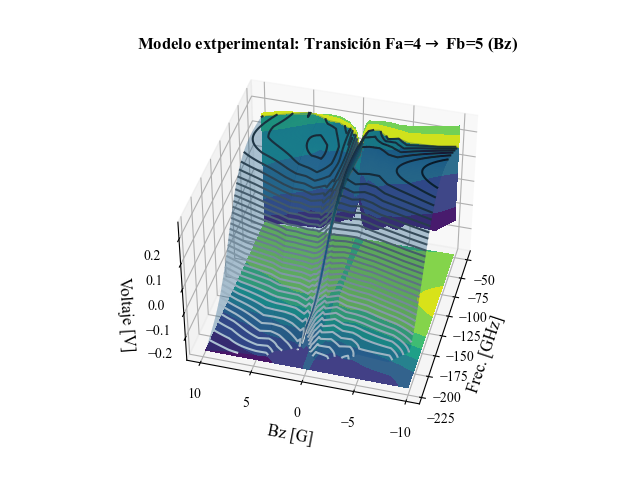

In [23]:
%matplotlib widget
C1_4=np.array(C1_3)
C00_4=np.array(C1_3)
N00_4=np.array(C1_3)
A3_4=np.array(C1_3)
A4_4=np.array(C1_3)
A5_4=np.array(C1_3)

X, Y =np.meshgrid( nu, ORDER)

def f(x,y):
    resultado=np.zeros(np.shape(x))
    for i in range(np.shape(x)[0]):
        for j in range(np.shape(x)[1]):
            h=np.where(ORDER== y[i][j])[0][0]
       

            funcion=objective(x[i][j], C1_3[h.astype(int)],A3_3[h.astype(int)],A4_3[h.astype(int)],A5_3[h.astype(int)],C00_3[h.astype(int)],N00_3[h.astype(int)])
            resultado[i][j]=funcion
    return resultado

Z=f(X,Y)

fig7 = plt.figure() #figsize=(6.29,6.29), dpi=600
ax = plt.axes(projection='3d')
ax.plot_surface(X, Y, Z,rstride=7, cstride=7, alpha=0.4)
cset = ax.contourf(X, Y, Z, zdir='z', offset=min(y_min), cmap=cm.viridis)
cset = ax.contourf(X, Y, Z, zdir='x', offset=max(x_values), cmap=cm.viridis)
#cset = ax.contourf(X, Y, Z, zdir='y', offset=max(ORDER), cmap=cm.viridis)
plt.title('Modelo extperimental:'+' Transición Fa='+str(Fa)+r'$\rightarrow$ Fb='+str(Fb)+' ('+str(titulo)+')', fontsize=12,fontweight="bold")
plt.xlabel('Frec. [GHz]',fontsize=12)
ax.set_zlabel('Voltaje [V]',fontsize=12)
plt.ylabel(str(comp)+' [G]',fontsize=12)
ax.contour3D(X, Y, Z, 50, cmap='Greys')
ax.view_init(40, -165)
#plt.show()





# MODELO EXPERIMENTAL 3D

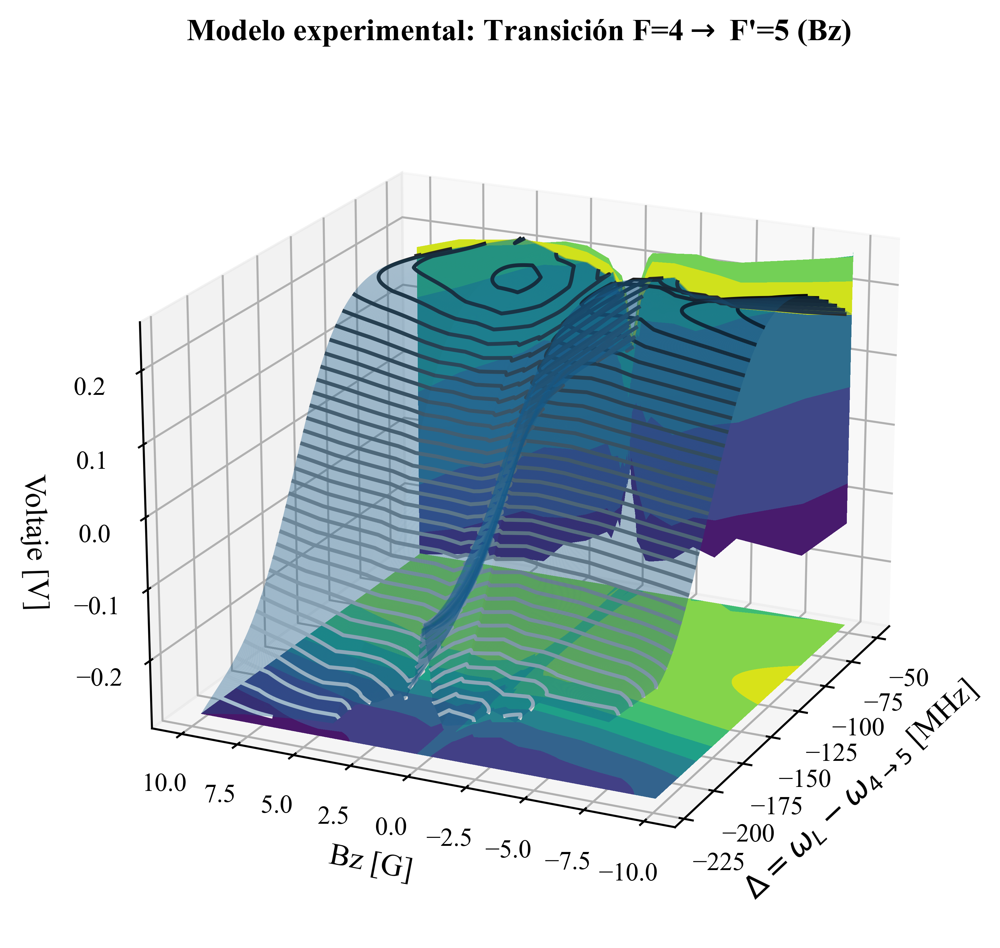

In [24]:
%matplotlib inline
fig8 = plt.figure(figsize=(6.29,6.29), dpi=600)
ax = plt.axes(projection='3d')
ax.plot_surface(X, Y, Z,rstride=7, cstride=7, alpha=0.4)
cset = ax.contourf(X, Y, Z, zdir='z', offset=min(y_min), cmap=cm.viridis)
cset = ax.contourf(X, Y, Z, zdir='x', offset=max(x_values), cmap=cm.viridis)
#cset = ax.contourf(X, Y, Z, zdir='y', offset=max(ORDER), cmap=cm.viridis)
plt.title('Modelo experimental:'+' Transición F='+str(Fa)+r"$\rightarrow$ F'="+str(Fb)+' ('+str(titulo)+')', fontsize=12,fontweight="bold")
plt.xlabel(r'$\Delta=\omega_L-\omega_{4\rightarrow '+str(Fb)+'}$'+' [MHz]',fontsize=12)
ax.set_zlabel('Voltaje [V]',fontsize=12)
plt.ylabel(str(comp)+' [G]',fontsize=12)
ax.contour3D(X, Y, Z, 50, cmap='binary')
ax.view_init(20, -155)
plt.savefig(str(titulo)+'_3D_modelF4F'+str(Fb)+'.png',bbox_inches='tight')
plt.show()
    
    
    
    

# PROYECCIONES DEL MODELO EXPERIMENTAL 3D

### PROYECCIÓN FREQ. VS B

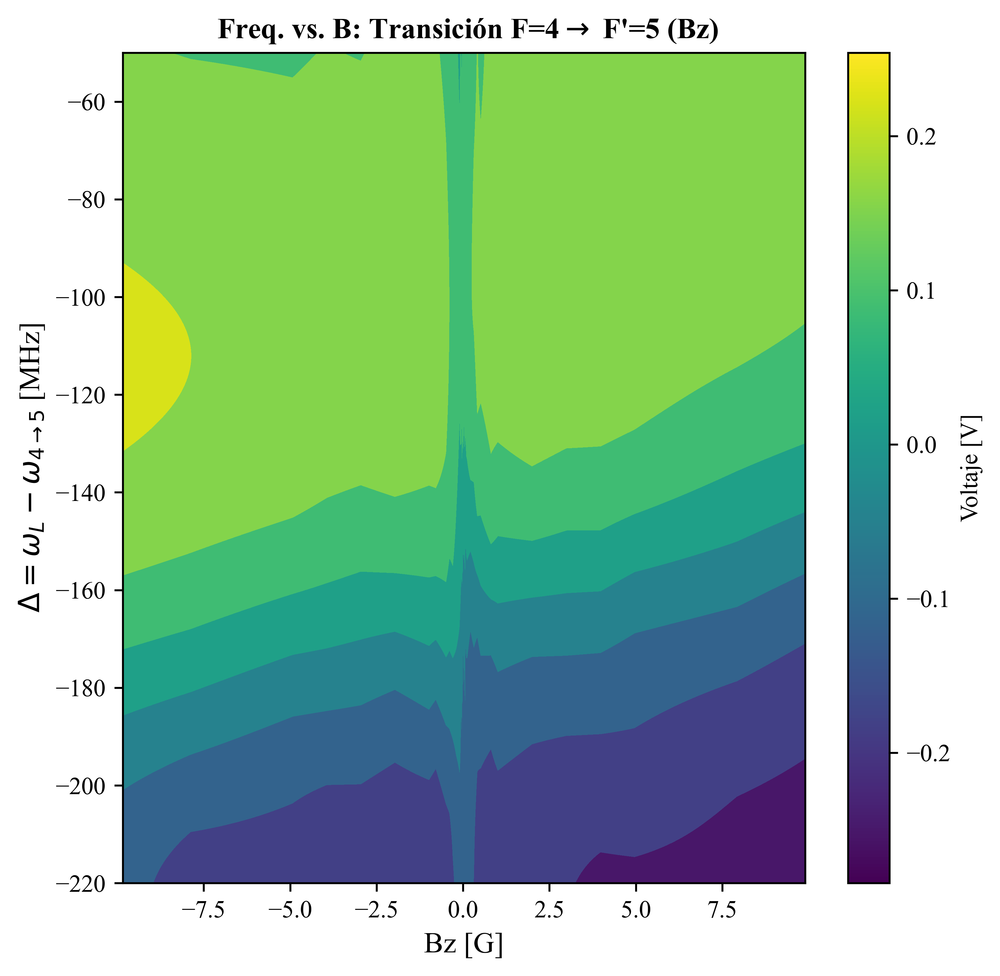

In [25]:
%matplotlib inline
fig9 = plt.figure(figsize=(6.29,6.29), dpi=600)
ax = plt.axes()
cset = ax.contourf(Y, X, Z, cmap=cm.viridis)
plt.title(' Freq. vs. B:'+' Transición F='+str(Fa)+r"$\rightarrow$ F'="+str(Fb)+' ('+str(titulo)+')', fontsize=12,fontweight="bold")
plt.ylabel(r'$\Delta=\omega_L-\omega_{4\rightarrow '+str(Fb)+'}$'+' [MHz]',fontsize=12)
plt.xlabel(str(comp)+' [G]',fontsize=12)
norm=Normalize(min(y_min), max(y_max))
plt.colorbar(ScalarMappable(norm=norm, cmap=cm.viridis),label="Voltaje [V]")
plt.savefig(str(titulo)+'_BvsFreq_modelF4F'+str(Fb)+'.png',bbox_inches='tight')
plt.show()

### PROYECCIÓN VOLTAJE. VS B

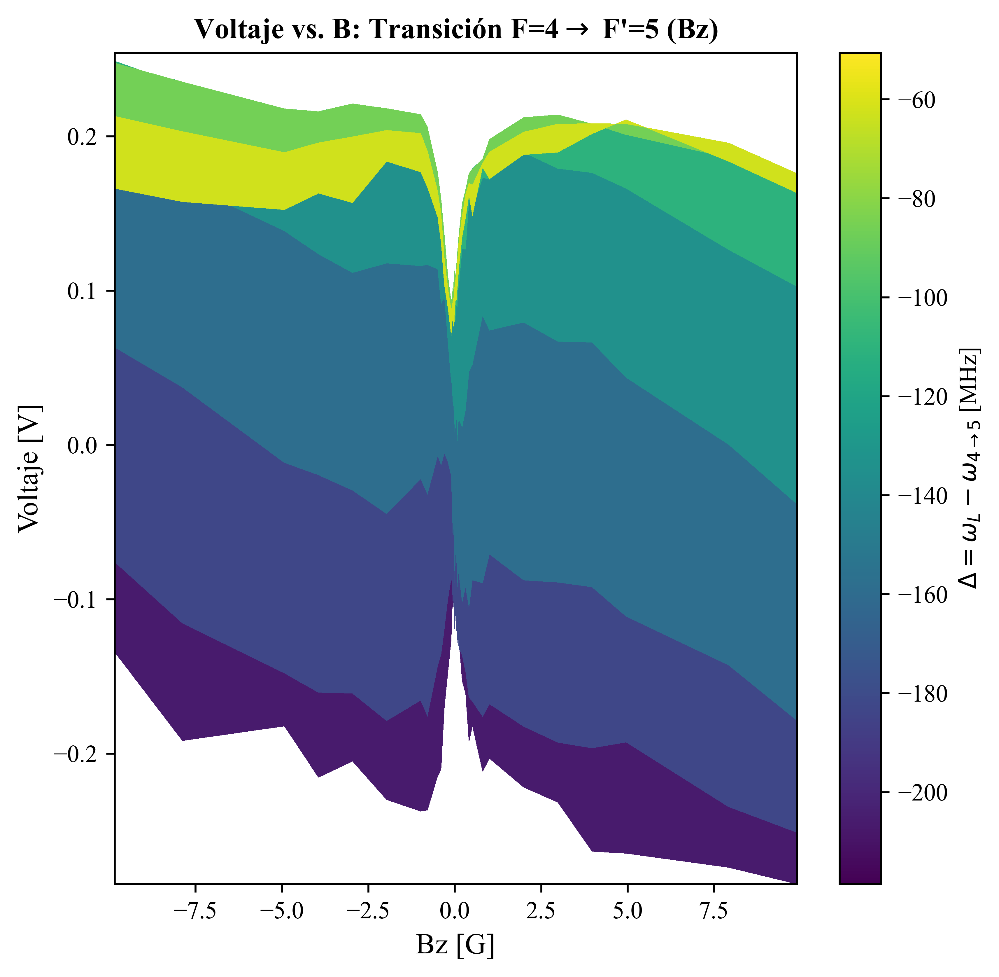

In [26]:
%matplotlib inline
fig10 = plt.figure(figsize=(6.29,6.29), dpi=600)
ax = plt.axes()
cset = ax.contourf(Y, Z, X, cmap=cm.viridis)
plt.title('Voltaje vs. B:'+' Transición F='+str(Fa)+r"$\rightarrow$ F'="+str(Fb)+' ('+str(titulo)+')', fontsize=12,fontweight="bold")
plt.ylabel('Voltaje [V]',fontsize=12)
plt.xlabel(str(comp)+' [G]',fontsize=12)
norm=Normalize(min(x_values), max(x_values))
plt.colorbar(ScalarMappable(norm=norm, cmap=cm.viridis),label=r'$\Delta=\omega_L-\omega_{4\rightarrow '+str(Fb)+'}$'+' [MHz]')
plt.savefig(str(titulo)+'_BvsVoltaje_modelF4F'+str(Fb)+'.png',bbox_inches='tight')
plt.show()

### PROYECCIÓN VOLTAJE VS. FREQ. 

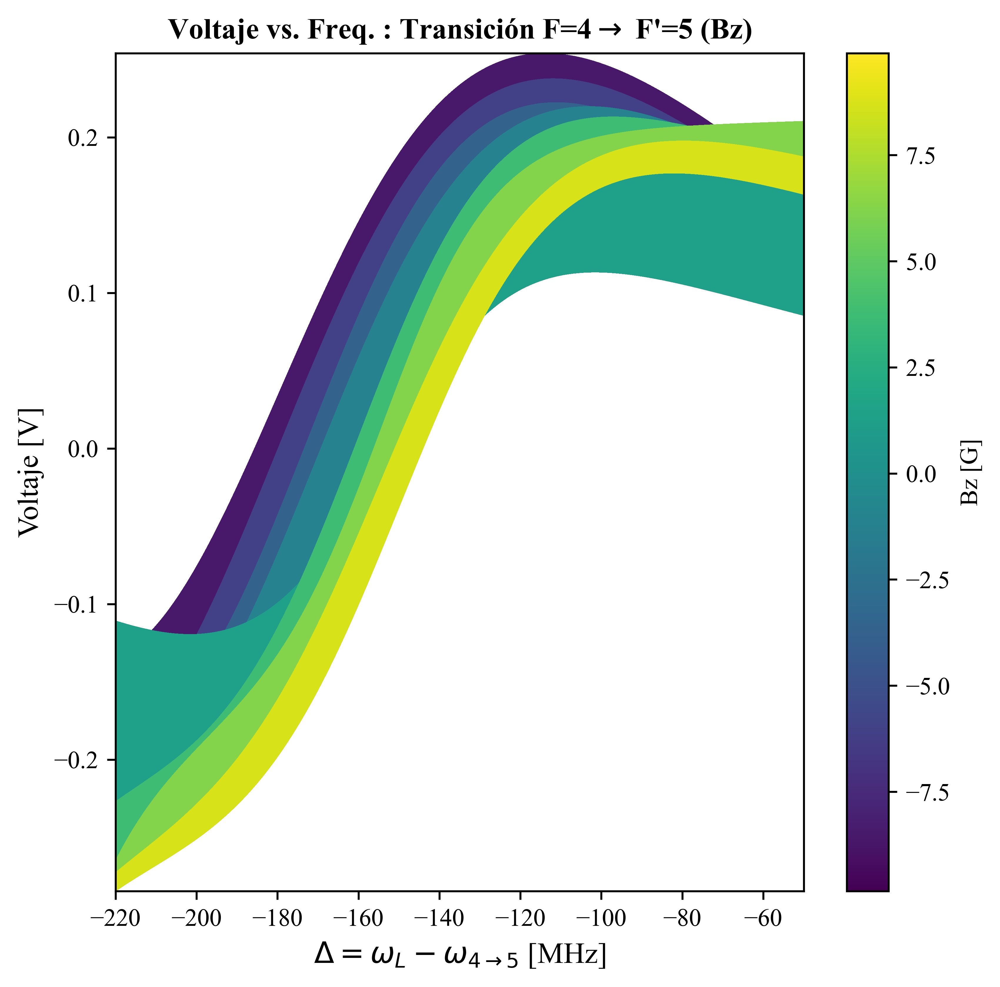

In [27]:
%matplotlib inline
fig11 = plt.figure(figsize=(6.29,6.29), dpi=600)
ax = plt.axes()
cset = ax.contourf(X, Z, Y, cmap=cm.viridis)
plt.title('Voltaje vs. Freq. :'+' Transición F='+str(Fa)+r"$\rightarrow$ F'="+str(Fb)+' ('+str(titulo)+')', fontsize=12,fontweight="bold")
plt.ylabel('Voltaje [V]',fontsize=12)
plt.xlabel(r'$\Delta=\omega_L-\omega_{4\rightarrow '+str(Fb)+'}$'+' [MHz]',fontsize=12)
norm=Normalize(min(ORDER), max(ORDER))
plt.colorbar(ScalarMappable(norm=norm, cmap=cm.viridis),label=str(comp)+' [G]')
plt.savefig(str(titulo)+'_VoltajevsFreq_modelF4F'+str(Fb)+'.png',bbox_inches='tight')
plt.show()

## WEAK FIELD ZEEMAN MODEL

### DEFINICIÓN DE MODELO A AJUSTAR

In [28]:
def zeeman_debil(B , A, C):
    fun=A*mF*B+C
    return(fun)

### EXTRAER DATOS UTILES PARA WEAK FIELD ZEEMAN, CORRECCIONES DE MEDICIÓN

In [29]:
mi=-2.5
ma=2.5

mi_i=0
ma_i=len(B_name_00)


for i in range(len(B_name_00)):
    if B_name_00[i]>mi:
        mi_i=i
        break
    else:
        continue

for i in range(len(B_name_00)):
    j=len(B_name_00)-i-1
    if B_name_00[j]<ma:
        ma_i=j
        break
    else:
        continue
        
max_y_i=np.argmax(x_00[mi_i:ma_i])
min_y_i=np.argmin(x_00[mi_i:ma_i])

print(ma_i,mi_i)
print(max_y_i,min_y_i)




33 5
19 5


### BUSCAR FREQ. DE RESONANCIA PARA B=0

In [30]:
A_TODOS=[]
C_ZD=[]

ZD_mse=[]
ZD_R2=[]

Y_ZD=np.array(x_00)[mi_i+min_y_i:mi_i+max_y_i+1]#[min_y_i:max_y_i+1]
X_ZD=np.array(B_name_00)[mi_i+min_y_i:mi_i+max_y_i+1]#[min_y_i:max_y_i+1]
    
for i in range(1000):
    A_i=np.random.uniform(-1, 1)
    C_i=np.random.uniform(-160, -170)

    popt, matrix = curve_fit(zeeman_debil, X_ZD,Y_ZD, p0=[ A_i , C_i]) #,  C_i
    A_TODOS.append(popt[0])
    C_ZD.append(popt[1])

    y_model=zeeman_debil(X_ZD, popt[0],popt[1])#

    mse_i=mean_squared_error(Y_ZD, y_model,squared=False)
    ZD_mse.append(mse_i)

    R2_i= r2_score(Y_ZD, y_model)
    ZD_R2.append(R2_i)
    
i_ZD_mse=np.argmin(ZD_mse)
i_ZD_R2=np.argmax(ZD_R2)

print(i_ZD_R2 ,i_ZD_mse)
print('C mejor =',C_ZD[i_ZD_mse], ',A mejor:',A_TODOS[i_ZD_mse]) #Gf_TODOS[i_ZD_mse],
print('rmse:',ZD_mse[i_ZD_mse],',R2:',ZD_R2[i_ZD_mse])





249 727
C mejor = -156.08897769047758 ,A mejor: 13.783264491534641
rmse: 2.3258259858494332 ,R2: 0.8903333081377555


In [31]:

dB=0.5*abs(min(X_ZD)-max(X_ZD))-max(X_ZD)



num=10000
nu=np.linspace(min(X_ZD),max(X_ZD),num)
disp_o=zeeman_debil(nu, A_TODOS[i_ZD_mse],C_ZD[i_ZD_mse])
disp_c=zeeman_debil(nu-dB, A_TODOS[i_ZD_mse],C_ZD[i_ZD_mse])
ceros_o=0
cero_c=0

for j in range(len(nu)-1):
    r=nu[j]*nu[j+1]
    if r<0:
        b=nu[j]*(abs(disp_c[j+1]-disp_c[j]))/(abs(nu[j+1]-nu[j]))
        cero_c=disp_c[j+1]-abs(b)
        break
    else:
        continue





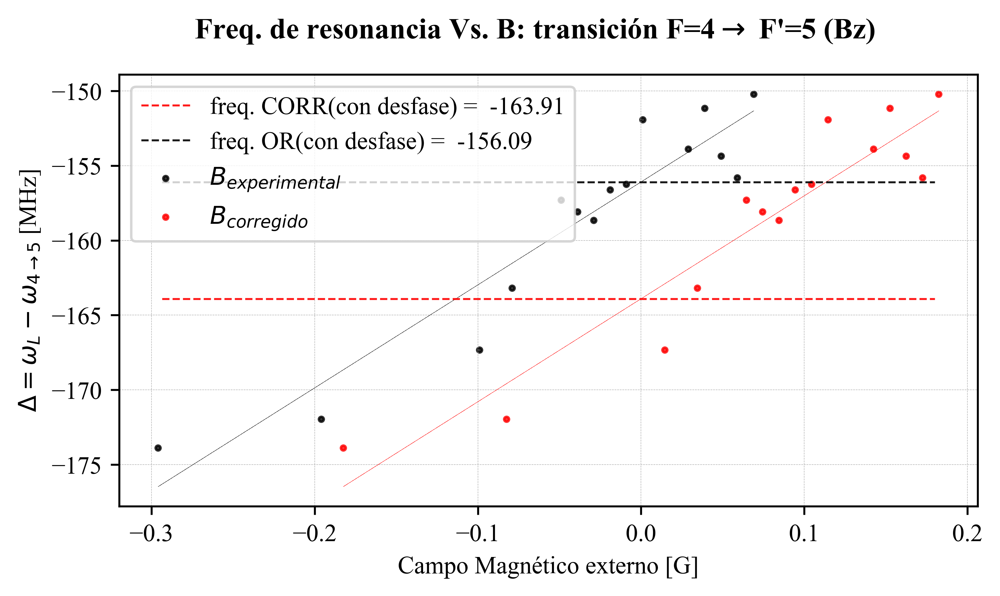

In [32]:


fig12, axs = plt.subplots( figsize=(6.29,6.5/2), dpi=600)
fig12.suptitle('Freq. de resonancia Vs. B: '+'transición F='+str(Fa)+r"$\rightarrow$ F'="+str(Fb)+' ('+str(titulo)+')', fontsize=12,fontweight="bold")

#plt.scatter(B_name_00, x_00,s=3,c='b')

plt.scatter(X_ZD, Y_ZD, label=r'$B_{experimental}$',s=4, alpha=0.8, c='k')
plt.scatter(X_ZD+dB, Y_ZD, label=r'$B_{corregido}$',s=4, alpha=0.8, c='r')

plt.plot(nu,disp_o,',',c='k',linewidth=0.8)
plt.plot(nu+dB,disp_o,',',c='r',linewidth=0.8)



axs.axhline(y=cero_c, xmin=0.05, xmax=0.95, c='r',linestyle="--", label=r'freq. CORR(con desfase) =  {:.2f}'.format(cero_c), lw=0.8,alpha=0.9 )
axs.axhline(y=C_ZD[i_ZD_mse], xmin=0.05, xmax=0.95, c='k',linestyle="--", label=r'freq. OR(con desfase) =  {:.2f}'.format(C_ZD[i_ZD_mse]), lw=0.8,alpha=0.9 )
plt.legend(fontsize=10)
plt.ylabel(r'$\Delta=\omega_L-\omega_{4\rightarrow '+str(Fb)+'}$'+' [MHz]',fontsize=10)
plt.xlabel(r'Campo Magnético externo [G]', fontsize=10)
plt.grid(linestyle = '--', linewidth = 0.2)
#plt.savefig(str(titulo)+'_CentrosW4'+str(Fb)+'.png',bbox_inches='tight')
plt.show()




In [33]:
print(dB)
print(cero_c)

0.11349999999999999
-163.9123794306835


# WF ZEEMAN MODEL

In [34]:
ZD_R2_F=[]
ZD_mse_F=[]


A_TODOS_F=[]
C_ZD_F=[]


bloque_y_min_a=x_00[:mi_i+min_y_i+1]
bloque_y_min=bloque_y_min_a[:np.argmax(bloque_y_min_a)+1]
bloque_y_max_a=x_00[mi_i+max_y_i:]
bloque_y_max=bloque_y_max_a[np.argmin(bloque_y_max_a):]
bloque_y=bloque_y_min+bloque_y_max
Y_ZD_F=np.array(bloque_y)-cero_c


bloque_x_min=B_name_00[:len(bloque_y_min)]
#bloque_x_min=bloque_x_min[:np.argmax(bloque_y_min)+1]
bloque_x_max=B_name_00[-len(bloque_y_max):]
#bloque_x_max=bloque_x_max[np.argmin(bloque_y_max):]
bloque_x=bloque_x_min+bloque_x_max
X_ZD_F=np.array(bloque_x)+dB


#numero=len(B_name_00)/2
#limites= math.floor(numero)-1

       
for i in range(1000):
    A_i_F=np.random.uniform(-1, 1)
    C_i_F=np.random.uniform(-1, 1)

    popt, matrix = curve_fit(zeeman_debil, X_ZD_F,Y_ZD_F, p0=[ A_i_F , C_i_F]) #,  C_i
    A_TODOS_F.append(popt[0])
    C_ZD_F.append(popt[1])

    y_model=zeeman_debil(X_ZD_F, popt[0],popt[1])#

    mse_i_F=mean_squared_error(Y_ZD_F, y_model,squared=False)
    ZD_mse_F.append(mse_i_F)

    R2_i_F= r2_score(Y_ZD_F, y_model)
    ZD_R2_F.append(R2_i_F)
    
i_ZD_mse_F=np.argmin(ZD_mse_F)
i_ZD_R2_F=np.argmax(ZD_R2_F)

print(i_ZD_R2_F ,i_ZD_mse_F)
print('C mejor =',C_ZD_F[i_ZD_mse_F], ',A mejor:',A_TODOS_F[i_ZD_mse_F]) #Gf_TODOS[i_ZD_mse],
print('rmse:',ZD_mse_F[i_ZD_mse_F],',R2:',ZD_R2_F[i_ZD_mse_F])

#Y_ZD=np.array(x_00)[mi_i:ma_i][min_y_i:max_y_i]*10**6-C_ZD[i_ZD_mse]




0 3
C mejor = -1.5559712214332937 ,A mejor: 0.3890902056391705
rmse: 1.24395459979939 ,R2: 0.9876895069221122


C final= -165.46835065211678 ,A final: 0.3890902056391705


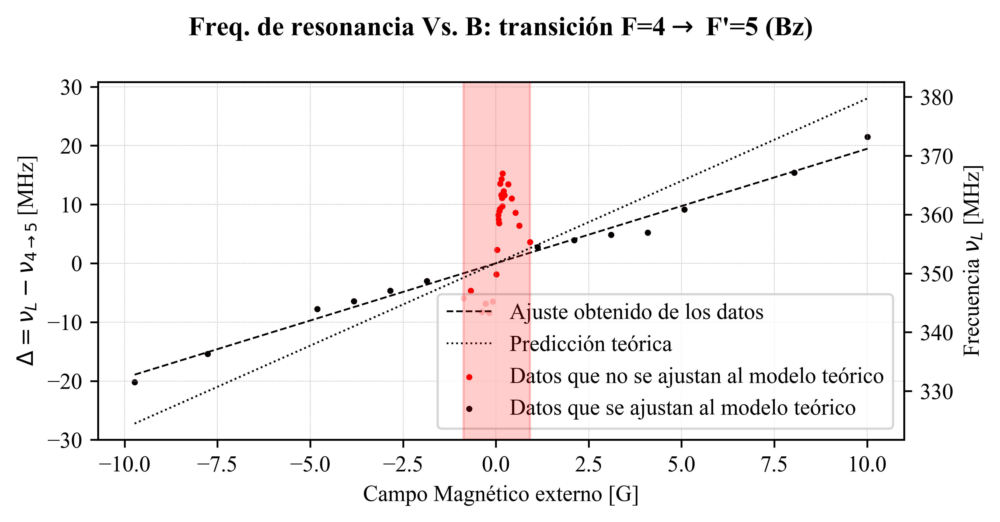

In [35]:
cero_final=C_ZD_F[i_ZD_mse_F]+cero_c
print('C final=',cero_final, ',A final:',A_TODOS_F[i_ZD_mse_F]) #Gf_TODOS[i_ZD_mse],

A_ideal=mu_B_sin*0.4

fig13, axs = plt.subplots( figsize=(6.29,6.5/2), dpi=600)
fig13.suptitle('Freq. de resonancia Vs. B: '+'transición F='+str(Fa)+r"$\rightarrow$ F'="+str(Fb)+' ('+str(titulo)+')', fontsize=12,fontweight="bold")

nu_F=np.linspace(min(X_ZD_F),max(X_ZD_F),num)
disp_F=zeeman_debil(nu_F, A_TODOS_F[i_ZD_mse_F],C_ZD_F[i_ZD_mse_F]-C_ZD_F[i_ZD_mse_F])
disp_ideal=zeeman_debil(nu_F, A_ideal,C_ZD_F[i_ZD_mse_F]-C_ZD_F[i_ZD_mse_F])

abajo=B_name_00[len(bloque_x_min)]+dB
arriba=B_name_00[-len(bloque_x_max)-1]+dB






plt.scatter(B_name_00+dB, x_00-cero_final,s=3,c='r', label='Datos que no se ajustan al modelo teórico')
plt.scatter(X_ZD_F, Y_ZD_F-C_ZD_F[i_ZD_mse_F],s=3,c='k',label='Datos que se ajustan al modelo teórico')


plt.plot(nu_F,disp_F,'--',c='k',linewidth=0.8,label='Ajuste obtenido de los datos')
plt.plot(nu_F,disp_ideal,':',c='k',linewidth=0.8,label='Predicción teórica')



#axs.axline(y=C_ZD_F[i_ZD_mse_F], xmin=0.05, xmax=0.95, c='r',linestyle="dotted", label=r'freq. CORR(con desfase) =  {:.2f}'.format(C_ZD_F[i_ZD_mse_F]), lw=0.4,alpha=0.9 )
#axs.axhline(y=C_ZD[i_ZD_mse], xmin=0.05, xmax=0.95, c='k',linestyle="--", label=r'freq. OR(con desfase) =  {:.2f}'.format(C_ZD[i_ZD_mse]), lw=0.8,alpha=0.9 )
plt.legend(fontsize=10)
plt.ylabel(r'$\Delta=\nu_L-\nu_{4\rightarrow '+str(Fb)+'}$'+' [MHz]',fontsize=10)
plt.xlabel(r'Campo Magnético externo [G]', fontsize=10)
plt.grid(linestyle = '--', linewidth = 0.2)

ax2=axs.twinx()

ax2.axvspan(abajo, arriba, alpha=0.2, color='red')
ax2.plot(nu_F,disp_ideal+W0_teo,':',c='k',linewidth=0.8)
ax2.set_ylabel(r'Frecuencia $\nu_L$ [MHz]',fontsize=10) 

#plt.savefig(str(titulo)+'_CentrosW4'+str(Fb)+'.png',bbox_inches='tight')
fig13.tight_layout() 
plt.show()



# Modelo realizado para región roja

In [36]:
def NO_ZD(nu, A,B,C,D):
    A=abs(A)
    B=abs(B)
    C=abs(C)
    fun=C*(A*nu)/(B+(A*nu)**2)+D
    return(fun)


def SHIFT(X,mFa,mFb):
    gFa=1/4
    gFb=2/5
    fun=X*mu_B_sin*(gFb*mFb-gFa*mFa)+W0_teo
    return(fun)

In [37]:
R2_NO=[]
mse_NO=[]

A_NO=[]
B_NO=[]
C_NO=[]
D_NO=[]

X_NO=np.array(B_name_00[len(bloque_x_min)-1:-len(bloque_x_max)+1])+dB
Y_NO=np.array(x_00[len(bloque_x_min)-1:-len(bloque_x_max)+1])-cero_final


In [38]:
for i in range(10000):
    A_NO_i=np.random.uniform(5, 10)
    B_NO_i=np.random.uniform(0, 4)
    C_NO_i=np.random.uniform(30, 40)
    D_NO_i=np.random.uniform(0, 2)

    popt, matrix = curve_fit(NO_ZD, X_NO, Y_NO, p0=[A_NO_i, B_NO_i, C_NO_i, D_NO_i ], maxfev=10000) #,  C_i
   
    A_NO.append(popt[0])
    B_NO.append(popt[1])
    C_NO.append(popt[2])
    D_NO.append(popt[3])

    y_model=NO_ZD(X_NO, popt[0],popt[1],popt[2],popt[3])#

    mse_i_NO=mean_squared_error(Y_NO, y_model,squared=False)
    mse_NO.append(mse_i_NO)

    R2_i_NO= r2_score(Y_NO, y_model)
    R2_NO.append(R2_i_NO)
    
i_NO_mse=np.argmin(mse_NO)
i_NO_R2=np.argmax(R2_NO)

print(i_NO_R2 ,i_NO_mse)
print('rmse:',mse_NO[i_NO_mse],',R2:',R2_NO[i_NO_R2])

print( A_NO[i_NO_mse], B_NO[i_NO_mse] , C_NO[i_NO_mse] ,D_NO[i_NO_mse])

1192 1192
rmse: 1.8807758307431717 ,R2: 0.9383414416738558
6.205286680407356 1.6529296740264319 28.695902740015562 0.8433648333264931


In [39]:
resolucion=1000000
x_todo=np.linspace(min(X_ZD_F),max(X_ZD_F),1000000)
f = NO_ZD(x_todo, A_NO[i_NO_mse], B_NO[i_NO_mse] , C_NO[i_NO_mse] ,D_NO[i_NO_mse])
g = zeeman_debil(x_todo, A_TODOS_F[i_ZD_mse_F],C_ZD_F[i_ZD_mse_F]-C_ZD_F[i_ZD_mse_F])
idx = np.argwhere(np.diff(np.sign(f - g))).flatten()
print(idx)
B1=x_todo[idx[0]]
B2=x_todo[idx[1]]
B3=x_todo[idx[2]]
print(B1,B2,B3)

[425887 492428 582138]
-1.3217786632786623 -0.00799184549184595 1.7632441657441653


# CÁLCULO DE ERROR

In [40]:


y_c=x_00-cero_final
x_c=B_name_00+dB

y_error_1=[]
y_error_2=[]
y_error_all=[]

for i in range(len(y_c)):
    
    if i< len(y_c[:len(bloque_y_min)]) or i>(len(y_c)-len(y_c[-len(bloque_y_max):])-1):
        e=y_c[i]-zeeman_debil(x_c[i], A_TODOS_F[i_ZD_mse_F],C_ZD_F[i_ZD_mse_F]-C_ZD_F[i_ZD_mse_F])
        y_error_1.append(e)
        y_error_all.append(e)
    else:
        e=y_c[i]-NO_ZD(x_c[i], A_NO[i_NO_mse], B_NO[i_NO_mse] , C_NO[i_NO_mse] ,D_NO[i_NO_mse])
        y_error_2.append(e)
        y_error_all.append(e)
    
    
a_1=np.std(y_error_1, ddof=1)
a_2=np.std(y_error_2, ddof=1)
a_all=np.std(y_error_all, ddof=1)

err_1=a_1
err_2=a_2
err_all=a_all

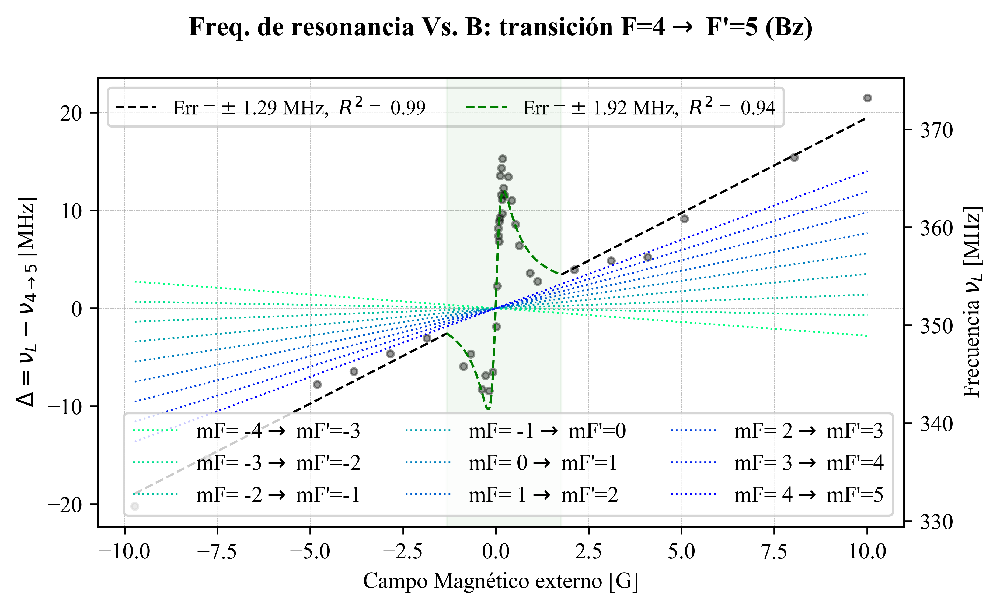

In [41]:
fig14, axs = plt.subplots( figsize=(6.29,3.8), dpi=600)
fig14.suptitle('Freq. de resonancia Vs. B: '+'transición F='+str(Fa)+r"$\rightarrow$ F'="+str(Fb)+' ('+str(titulo)+')', fontsize=12,fontweight="bold")

nu_1=x_todo[:idx[0]]
nu_2=x_todo[idx[0]:idx[2]]
nu_3=x_todo[idx[2]:]



disp_1=zeeman_debil(nu_1, A_TODOS_F[i_ZD_mse_F],C_ZD_F[i_ZD_mse_F]-C_ZD_F[i_ZD_mse_F])
disp_2=NO_ZD(nu_2, A_NO[i_NO_mse], B_NO[i_NO_mse] , C_NO[i_NO_mse] ,D_NO[i_NO_mse])
disp_3=zeeman_debil(nu_3, A_TODOS_F[i_ZD_mse_F],C_ZD_F[i_ZD_mse_F]-C_ZD_F[i_ZD_mse_F])


plt.scatter(B_name_00+dB, x_00-cero_final,s=9,c='k',alpha=0.4,edgecolors=None)


abajo=B1
arriba=B3

plt.plot(nu_1,disp_1,'--',c='k',linewidth=1,label=r'Err = $\pm$ {:.2f}'.format(err_1)+' MHz,  $R^2$ =  {:.2f}'.format(ZD_R2_F[i_ZD_mse_F]))
plt.plot(nu_2,disp_2,'--',c='g',linewidth=1,label=r'Err = $\pm$ {:.2f}'.format(err_2)+' MHz,  $R^2$ =  {:.2f}'.format(R2_NO[i_NO_R2]))
plt.plot(nu_3,disp_3,'--',c='k',linewidth=1)
#plt.plot(nu_F,disp_ideal,':',c='k',linewidth=0.8,label='Predicción teórica')

plt.legend(fontsize=9,ncol = 2,loc="upper left")
plt.ylabel(r'$\Delta=\nu_L-\nu_{4\rightarrow '+str(Fb)+'}$'+' [MHz]',fontsize=10)
plt.xlabel(r'Campo Magnético externo [G]', fontsize=10)
plt.grid(linestyle = '--', linewidth = 0.2)

ax2=axs.twinx()

ax2.axvspan(abajo, arriba, alpha=0.05, color='green')
plt.scatter(B_name_00+dB, x_00-cero_final+W0_teo,s=9,c='k',alpha=0,edgecolors=None)
ax2.set_ylabel(r'Frecuencia $\nu_L$ [MHz]',fontsize=10)

colors_14 = cm.winter(np.linspace(0, 1,1+2*Fa))
s=0
for i in range(-Fa, Fa+1,1):
    q=1 ## pol cicular derecha , pi-> q=0 cicular izq q= -1
    d_Nu=SHIFT(x_todo,i,i+q)
    plt.plot(x_todo,d_Nu,':',c=colors_14[-s-1],linewidth=0.8,label='mF= '+str(i)+r"$\rightarrow$ mF'="+str(i+q))
    s+=1

plt.legend(fontsize=10,loc="lower right", ncol = 3)

plt.savefig(str(titulo)+'_FRE-RESO-VS-B_FINAL_F4'+str(Fb)+'.png',bbox_inches='tight')
fig14.tight_layout() 
plt.show()

# MODELO ANISOTROPIA VS  B

### MODELO A AJUSTAR

In [42]:
def anisoB(x,A,B,C,D,E,F,G,H):
    fun=(A*x**3 + B*x**2 + C*x +D)/( E*x**2 + F*x +G)+H
    return(fun)

In [43]:
A_ani=[]
B_ani=[]
C_ani=[]
D_ani=[]
E_ani=[]
F_ani=[]
G_ani=[]
H_ani=[]


R2_ani=[]
mse_ani=[]



y_ani=np.array(y_max)
x_ani=(np.array(B_name_00)+dB)

i_menos=np.where(x_ani<abajo)
i_mas=np.where(x_ani>arriba)

B_name_array=np.array(B_name_00)

x_menos_linea=B_name_array[i_menos].tolist()
x_mas_linea=B_name_array[i_mas].tolist()

y_max_array=np.array(y_max)

y_menos_linea=y_max_array[i_menos].tolist()
y_mas_linea=y_max_array[i_mas].tolist()

x_lin=(np.array(x_menos_linea+x_mas_linea)+dB)
y_lin=np.array(y_menos_linea+y_mas_linea)


idx_n=np.where((x_ani>abajo) & (x_ani<arriba) )

y_ade=np.array(y_max_array[idx_n])
x_ade=(np.array(B_name_array[idx_n])+dB)





for i in range(1000):
    try:
        A_i=np.random.uniform(-50, 50)
        B_i=np.random.uniform(-50, 50)
        C_i=np.random.uniform(-50, 50)
        D_i=np.random.uniform(-50, 50)
        E_i=np.random.uniform(-50, 50)
        F_i=np.random.uniform(-50, 50)
        G_i=np.random.uniform(-50, 50)
        H_i=np.random.uniform(-50, 50)

        popt, matrix = curve_fit(anisoB, x_ani, y_ani, maxfev=100000, p0=[ A_i, B_i, C_i, D_i, E_i, F_i,G_i,H_i] ) # , p0=[ A_i, B_i,C_i]
        A_ani.append(popt[0])
        B_ani.append(popt[1])
        C_ani.append(popt[2])
        D_ani.append(popt[3])
        E_ani.append(popt[4])
        F_ani.append(popt[5])
        G_ani.append(popt[6])
        H_ani.append(popt[7])



        y_model=anisoB(x_ani, popt[0],popt[1],popt[2],popt[3],popt[4],popt[5],popt[6],popt[7] )#

        mse_ani_i=mean_squared_error(y_ani, y_model,squared=False)
        mse_ani.append(mse_ani_i)

        R2_ani_i= r2_score(y_ani, y_model)
        R2_ani.append(R2_ani_i)
    
    except:
        print('sorri',i)
        continue
    
i_mse_ani=np.argmin(mse_ani)
i_R2_ani=np.argmax(R2_ani)


print(i_R2_ani ,i_mse_ani)
print(A_ani[i_mse_ani],B_ani[i_mse_ani],C_ani[i_mse_ani],D_ani[i_mse_ani],
      E_ani[i_mse_ani],F_ani[i_mse_ani],G_ani[i_mse_ani],H_ani[i_mse_ani]) #Gf_TODOS[i_ZD_mse],
print('rmse:',mse_ani[i_mse_ani],',R2:',R2_ani[i_mse_ani])




941 941
-0.577646904818473 3.7340958691718993 -1.3180886598803851 -2.010226238485558 211.02752889036913 5.901341921613542 20.001368068310832 0.19857279231786626
rmse: 0.005239631763345722 ,R2: 0.9880737171908114


### AJUSTE EN ZONA VERDE

In [44]:
A_an=[]
B_an=[]
C_an=[]
D_an=[]
E_an=[]
F_an=[]
G_an=[]
H_an=[]


R2_an=[]
mse_an=[]

for i in range(1000):
    try:
        A_i=np.random.uniform(-50, 50)
        B_i=np.random.uniform(-50, 50)
        C_i=np.random.uniform(-50, 50)
        D_i=np.random.uniform(-50, 50)
        E_i=np.random.uniform(-50, 50)
        F_i=np.random.uniform(-50, 50)
        G_i=np.random.uniform(-50, 50)
        H_i=np.random.uniform(-50, 50)

        popt, matrix = curve_fit(anisoB, x_ade, y_ade, maxfev=100000, p0=[ A_i, B_i, C_i, D_i, E_i, F_i,G_i,H_i] ) # , p0=[ A_i, B_i,C_i]
        A_an.append(popt[0])
        B_an.append(popt[1])
        C_an.append(popt[2])
        D_an.append(popt[3])
        E_an.append(popt[4])
        F_an.append(popt[5])
        G_an.append(popt[6])
        H_an.append(popt[7])



        y_model=anisoB(x_ade, popt[0],popt[1],popt[2],popt[3],popt[4],popt[5],popt[6],popt[7] )#

        mse_ani_i=mean_squared_error(y_ade, y_model,squared=False)
        mse_an.append(mse_ani_i)

        R2_ani_i= r2_score(y_ade, y_model)
        R2_an.append(R2_ani_i)
    
    except:
        print('sorri',i)
        continue
    
i_mse_an=np.argmin(mse_an)
i_R2_an=np.argmax(R2_an)


print(i_R2_an ,i_mse_an)
print(A_an[i_mse_an],B_an[i_mse_an],C_an[i_mse_an],D_an[i_mse_an],
      E_an[i_mse_an],F_an[i_mse_an],G_an[i_mse_an],H_an[i_mse_an]) #Gf_TODOS[i_ZD_mse],
print('rmse:',mse_an[i_mse_an],',R2:',R2_an[i_mse_an])




4 4
1.0160787742868769 -43.36290071042087 -0.15865305316460607 -2.5154673252893462 -120.84315161119149 -2.224261397200062 -10.351682036439835 -0.14582679502554355
rmse: 0.002768764338324557 ,R2: 0.9942343537262571


### AJUSTE  FUERA DEL ÁREA VERDE

In [45]:
def linea(x, A, B):
    fun=A*x+B
    return(fun)

A_lin=[]
B_lin=[]

R2_lin=[]
mse_lin=[]

for i in range(1000):
    try:
        A_i=np.random.uniform(-1, 1)
        B_i=np.random.uniform(-1, 1)


        popt, matrix = curve_fit(linea, x_lin, y_lin, maxfev=100000, p0=[ A_i, B_i] ) # , p0=[ A_i, B_i,C_i]
        A_lin.append(popt[0])
        B_lin.append(popt[1])

        y_model=linea(x_lin, popt[0],popt[1])#

        mse_ani_i=mean_squared_error(y_lin, y_model,squared=False)
        mse_lin.append(mse_ani_i)

        R2_ani_i= r2_score(y_lin, y_model)
        R2_lin.append(R2_ani_i)
    
    except:
        print('sorri',i)
        continue
    
i_mse_lin=np.argmin(mse_lin)
i_R2_lin=np.argmax(R2_lin)


print(i_R2_lin ,i_mse_lin)
print(A_lin[i_mse_lin],B_lin[i_mse_lin]) #Gf_TODOS[i_ZD_mse],
print('rmse:',mse_lin[i_mse_lin],',R2:',R2_lin[i_mse_lin])


plan_dat=plano(y_ani,anisoB(x_ani,A_ani[i_mse_ani],B_ani[i_mse_ani],C_ani[i_mse_ani],D_ani[i_mse_ani],
                    E_ani[i_mse_ani],F_ani[i_mse_ani],G_ani[i_mse_ani],H_ani[i_mse_ani]))

erri=np.std(plan_dat, ddof=1)



75 75
-0.002875683401004669 0.21645877381710282
rmse: 0.006978773667496084 ,R2: 0.8575737133489801


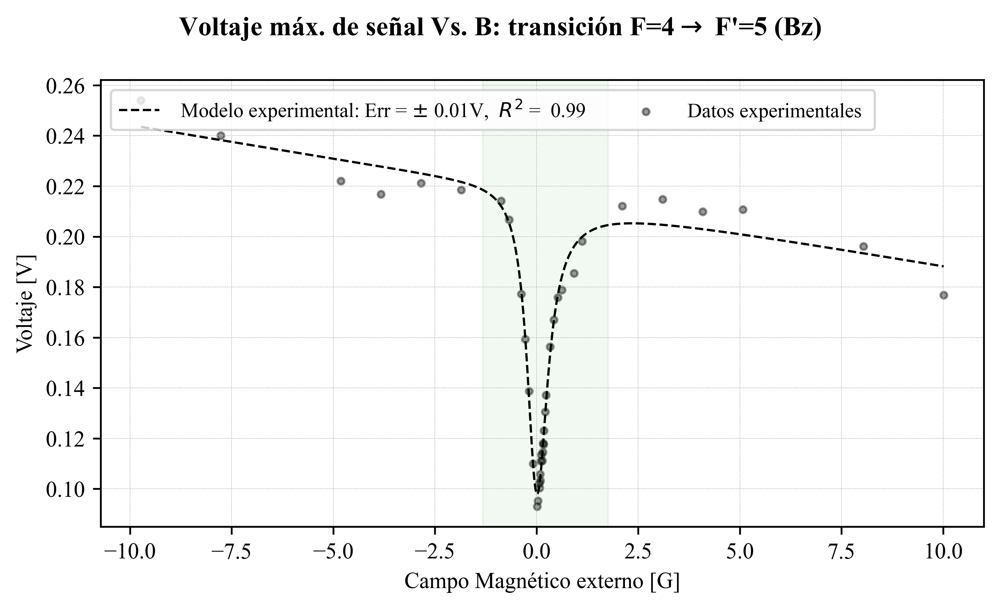

In [46]:
fig15, ax1 = plt.subplots( figsize=(6.29,3.8), dpi=600)
fig15.suptitle('Voltaje máx. de señal Vs. B: '+'transición F='+str(Fa)+r"$\rightarrow$ F'="+str(Fb)+' ('+str(titulo)+')', fontsize=12,fontweight="bold")

nu_ani=np.linspace(min(x_ani),max(x_ani),1000)


disp_ani_all=anisoB(nu_ani,A_ani[i_mse_ani],B_ani[i_mse_ani],C_ani[i_mse_ani],D_ani[i_mse_ani],
                    E_ani[i_mse_ani],F_ani[i_mse_ani],G_ani[i_mse_ani],H_ani[i_mse_ani])
disp_ani_ade=anisoB(nu_ani,A_an[i_mse_an],B_an[i_mse_an],C_an[i_mse_an],D_an[i_mse_an],
                    E_an[i_mse_an],F_an[i_mse_an],G_an[i_mse_an],H_an[i_mse_an])
disp_ani_lin=linea(nu_ani,A_lin[i_mse_lin],B_lin[i_mse_lin])



abajo=B1
arriba=B3

plt.plot( nu_ani,disp_ani_all,'--',c='k',linewidth=1,label=r' Modelo experimental: Err = $\pm$ {:.2f}'.format(erri*2)+'V,  $R^2$ =  {:.2f}'.format(R2_ani[i_mse_ani]))

plt.ylabel(r'Voltaje [V]',fontsize=10)
plt.xlabel(r' Voltaje [V]', fontsize=10)
plt.grid(linestyle = '--', linewidth = 0.2)

ax1.scatter( x_lin, y_lin,s=9,c='k',alpha=0.4,edgecolors=None,label=r' Datos experimentales ')
ax1.scatter( x_ade,y_ade,s=9,c='k',alpha=0.4,edgecolors=None)
ax1.axvspan(abajo, arriba, alpha=0.05, color='green')
ax1.set_xlabel(r' Campo Magnético externo [G] ', fontsize=10)

plt.legend(fontsize=9,ncol = 2,loc="upper left")
#ax2 = ax1.twiny()
#ax2.scatter( y_ani/(4*Vy_0_o),x_ani,s=9,c='k',alpha=0,edgecolors=None)
#ax2.set_xlabel(r' $\varphi$ [$ \circ$]', fontsize=10)


plt.savefig(str(titulo)+'_VOL-MAX-VS-B_FINAL_F4'+str(Fb)+'.png',bbox_inches='tight')
fig15.tight_layout() 
plt.show()

# ROTACIÓN EN CERO.  VOLTAJE(FREQ RESO(B=0) )VS B

### DATOS COMPLETOS

In [47]:
C1_N=C1_3
C00_N=C00_3
N00_N=N00_3
A3_N=A3_3
A4_N=A4_3
A5_N=A5_3

B_N=np.array(ORDER)+dB ## X
FREQ_N=cero_final
V_N=[]


for i in range(len(B_N)):
    V_i=objective(FREQ_N, C1_N[i],A3_N[i],A4_N[i],A5_N[i],C00_N[i],N00_N[i])
    V_N.append(V_i)

V_N=np.array(V_N) ## Y


### DATOS DENTRO Y FUERA ZONA VERDE

In [48]:

#############3

sig=np.array(SIGMAS)

i_me=np.where(B_N<abajo)
i_ma=np.where(B_N>arriba)

x_menos_li=B_N[i_me].tolist()
x_mas_li=B_N[i_ma].tolist()

S_menos=sig[i_ma].tolist()
S_mas=sig[i_ma].tolist()

y_menos_li=V_N[i_me].tolist()
y_mas_li=V_N[i_ma].tolist()

B_li=(np.array(x_menos_li+x_mas_li))
V_li=np.array(y_menos_li+y_mas_li)
S_li=S_menos+S_mas


idx_nO=np.where((B_N>abajo) & (B_N<arriba) )

V_ade=np.array(V_N[idx_nO])
B_ade=(np.array(B_N[idx_nO]))

##################

### MODELO DE LA CURVA ADENTRO

In [49]:
def NO_AD(nu, A,B,C,D):
    #A=abs(A)
    #B=abs(B)
    #C=abs(C)
    fun=C*(A*nu)/(B+(A*nu)**2)+D
    return(fun)

R2_AD=[]
mse_AD=[]

A_AD=[]
B_AD=[]
C_AD=[]
D_AD=[]

for i in range(10000):
    try:
        A_AD_i=np.random.uniform(-1, 1)
        B_AD_i=np.random.uniform(-1, 1)
        C_AD_i=np.random.uniform(0, 1)
        D_AD_i=np.random.uniform(-1, 1)

        popt, matrix = curve_fit(NO_AD, B_ade, V_ade, p0=[A_AD_i, B_AD_i, C_AD_i, D_AD_i ], maxfev=10000) #,  C_i

        A_AD.append(popt[0])
        B_AD.append(popt[1])
        C_AD.append(popt[2])
        D_AD.append(popt[3])

        y_model=NO_AD(B_ade, popt[0],popt[1],popt[2],popt[3])#

        mse_i_AD=mean_squared_error(V_ade, y_model,squared=False)
        mse_AD.append(mse_i_AD)

        R2_i_AD= r2_score(V_ade, y_model)
        R2_AD.append(R2_i_AD)
    except:
        print(i)
        continue
    
i_AD_mse=np.argmin(mse_AD)
i_AD_R2=np.argmax(R2_AD)

print(i_AD_R2 ,i_AD_mse)
print('rmse:',mse_AD[i_AD_mse],',R2:',R2_AD[i_AD_R2])

print( A_AD[i_AD_mse], B_AD[i_AD_mse] , C_AD[i_AD_mse] ,D_AD[i_AD_mse])

plaAD=plano(V_ade , NO_AD(B_ade, A_AD[i_AD_mse], B_AD[i_AD_mse] , C_AD[i_AD_mse] ,D_AD[i_AD_mse]))

erriAD=np.std(plaAD, ddof=1)

/Users/juanimartinez/opt/anaconda3/lib/python3.9/site-packages/scipy/optimize/minpack.py:833: OptimizeWarning: Covariance of the parameters could not be estimated
  warnings.warn('Covariance of the parameters could not be estimated',
/Users/juanimartinez/opt/anaconda3/lib/python3.9/site-packages/scipy/optimize/minpack.py:833: OptimizeWarning: Covariance of the parameters could not be estimated
  warnings.warn('Covariance of the parameters could not be estimated',


8932 8932
rmse: 0.008937246664680858 ,R2: 0.93134874508963
-0.3935383012562174 0.01335475475687475 0.011631076196300806 -0.003737258530237039


### MODELO LINEA AFUERA

In [50]:
A_l=[]
B_l=[]

R2_l=[]
mse_l=[]

for i in range(1000):
    try:
        A_i=np.random.uniform(-1, 1)
        B_i=np.random.uniform(-1, 1)


        popt, matrix = curve_fit(linea,B_li,V_li, maxfev=100000, p0=[ A_i, B_i] ) # , p0=[ A_i, B_i,C_i]
        A_l.append(popt[0])
        B_l.append(popt[1])

        y_model=linea(B_li, popt[0],popt[1])#

        mse_ani_i=mean_squared_error(V_li, y_model,squared=False)
        mse_l.append(mse_ani_i)

        R2_ani_i= r2_score(V_li, y_model)
        R2_l.append(R2_ani_i)
    
    except:
        print('sorri',i)
        continue
    
i_mse_l=np.argmin(mse_l)
i_R2_l=np.argmax(R2_l)


print(i_R2_l ,i_mse_l)
print(A_l[i_mse_l],B_l[i_mse_l]) #Gf_TODOS[i_ZD_mse],
print('rmse:',mse_l[i_mse_l],',R2:',R2_l[i_mse_l])

plaL=plano(V_li , linea(B_li,A_l[i_mse_l],B_l[i_mse_l]))

erriL=np.std(plaL, ddof=1)

0 350
-0.011865065514722873 -0.0006216525646629383
rmse: 0.006686017631580965 ,R2: 0.9911250520340038


In [51]:
resolucion=1000000
x_todoN=np.linspace(min(B_N),max(B_N),1000000)
fN = NO_AD(x_todoN,A_AD[i_AD_mse], B_AD[i_AD_mse] , C_AD[i_AD_mse] ,D_AD[i_AD_mse])
gN = linea(x_todoN,A_l[i_mse_l],B_l[i_mse_l])
idxN = np.argwhere(np.diff(np.sign(fN - gN))).flatten()
print(idxN)
B1N=x_todoN[idxN[0]]
B2N=x_todoN[idxN[1]]
B3N=x_todoN[idxN[2]]
print(B1N,B2N,B3N)

[420920 492355 578521]
-1.4198472093472088 -0.009433158933159547 1.6918300463300469


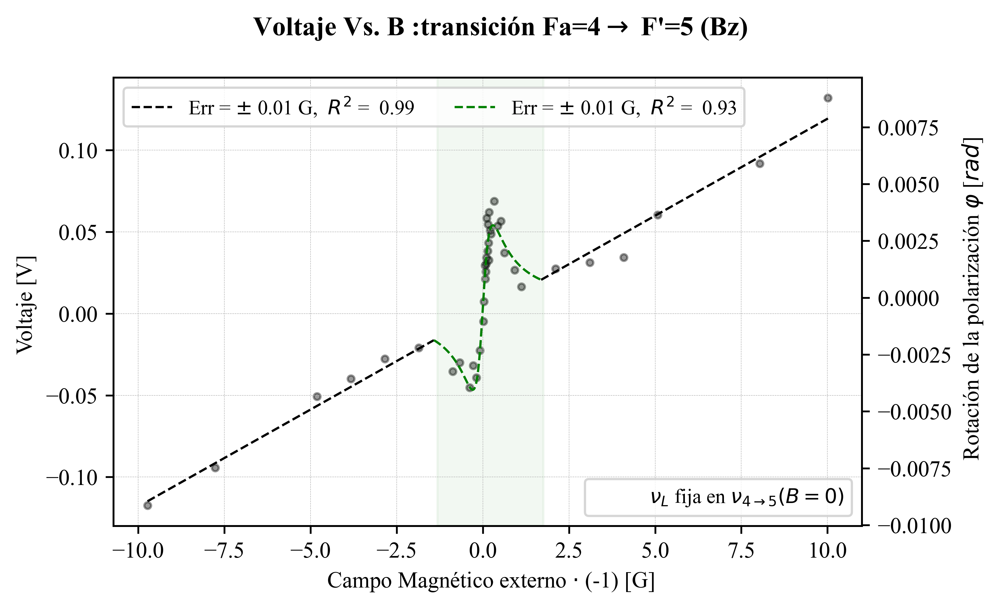

In [52]:
%matplotlib inline
fig16, ax1 = plt.subplots( figsize=(6.29,3.8), dpi=600)
fig16.suptitle(r'Voltaje Vs. B :'+'transición Fa='+str(Fa)+r"$\rightarrow$ F'="+str(Fb)+' ('+str(titulo)+')', fontsize=12,fontweight="bold")


nu_1N=x_todoN[:idxN[0]]
nu_2N=x_todoN[idxN[0]:idxN[2]]
nu_3N=x_todoN[idxN[2]:]



disp_1N=linea(nu_1N,A_l[i_mse_l],B_l[i_mse_l])
disp_2N=NO_AD(nu_2N,A_AD[i_AD_mse], B_AD[i_AD_mse] , C_AD[i_AD_mse] ,D_AD[i_AD_mse])
disp_3N=linea(nu_3N,A_l[i_mse_l],B_l[i_mse_l])



abajoN=B1N
arribaN=B3N

plt.scatter(B_N, -V_N,s=9,c='k',alpha=0.4,edgecolors=None)


plt.plot(nu_1N,-disp_1N,'--',c='k',linewidth=1,label=r'Err = $\pm$ {:.2f}'.format(erriL)+' G,  $R^2$ =  {:.2f}'.format(R2_l[i_mse_l]))
plt.plot(nu_2N,-disp_2N,'--',c='g',linewidth=1,label=r'Err = $\pm$ {:.2f}'.format(erriAD)+' G,  $R^2$ =  {:.2f}'.format(R2_AD[i_AD_R2]))
plt.plot(nu_3N,-disp_3N,'--',c='k',linewidth=1)



plt.legend(fontsize=9,ncol = 2,loc="upper left")
plt.ylabel(r'Voltaje [V] ',fontsize=10)
plt.xlabel(r' Campo Magnético externo $\cdot$ (-1) [G]', fontsize=10)
plt.grid(linestyle = '--', linewidth = 0.2)


ax1.axvspan(abajo, arriba, alpha=0.05, color='green')



ax2 = ax1.twinx()

ax2.set_ylabel(r' Rotación de la polarización $\varphi$ [$rad$]', fontsize=10)

plt.scatter( x_todoN,gN/(4*Vy_0_o),s=9,c='k',alpha=0,edgecolors=None, label=r"$\nu_L$ fija en $\nu_{4\rightarrow5}(B=0) $")
plt.legend(fontsize=9,ncol = 1,loc="lower right")






plt.savefig(str(titulo)+'_VOL-VS-B-FREQFIJA_FINAL_F4'+str(Fb)+'.png',bbox_inches='tight')
fig16.tight_layout() 
plt.show()

# CALCULO DE LA CONSTANTE DE VERDET PARA TRANSICION F4 A F5 DEL CESIO BAJO BOMBEO OPTICO CON LUZ POLARIZADA RHP

In [56]:
Xf=B_li
Yf=V_li
Sy=np.array(S_li)
Sx=0.001


A_VERDET=[]
B_VERDET=[]



for i in range(10000):

    yp=[]
    xp=[]  

    for j in range(len(Yf)):
        noise=np.random.normal(loc = 0.0, scale = Sy[j], size = None)
        y_i=Yf[j]+noise
        yp.append(y_i)


    for k in range(len(Xf)):
        noise=np.random.normal(loc = 0.0, scale = Sx, size = None)
        x_i=Xf[k]+noise
        xp.append(x_i)
        
    try:

        A_i=np.random.uniform(-1, 1)
        B_i=np.random.uniform(-1, 1)


        popt, matrix = curve_fit(linea, xp, yp, maxfev=10000, p0=[ A_i, B_i] ) # , p0=[ A_i, B_i,C_i]
        A_VERDET.append(popt[0])
        B_VERDET.append(popt[1])
    
    except:
        print('sorri',i)
        continue


    
    
    
A_max_VERDET=A_VERDET[np.argmax(A_VERDET)]
A_min_VERDET=A_VERDET[np.argmin(A_VERDET)]
A_prom_VERDET=np.mean(A_VERDET)
A_error_VERDET=np.std(A_VERDET, ddof=1)*3


print('ERROR DE PENDIENTE:',A_error_VERDET,  'PEN PROMEDIO:',A_prom_VERDET, 'PEN :', A_l[i_mse_l])


ERROR DE PENDIENTE: 0.005709472787787955 PEN PROMEDIO: -0.011827325166105351 PEN : -0.011865065514722873


In [57]:
VERDET_mas=  (abs( A_l[i_mse_l] )+A_error_VERDET)/(L_celda) 
VERDET_menos=( abs(A_l[i_mse_l])-A_error_VERDET)/(L_celda )
VERDET_error=abs(VERDET_mas-VERDET_menos)/2
VERDET= abs(A_l[i_mse_l]/(L_celda))
print('La constante de Verdet es:', VERDET,'+/-',VERDET_error , '[rad]/([G][m])')
print('La constante de Verdet es:', VERDET*10**4,'+/-',VERDET_error*10**4 , '[rad]/([T][m])')

La constante de Verdet es: 0.16525160884015141 +/- 0.07951911960707458 [rad]/([G][m])
La constante de Verdet es: 1652.5160884015143 +/- 795.1911960707458 [rad]/([T][m])
